In [1]:
# ==========================
# MODULE IMPORTS
# ==========================

# --- Standard library ---
import os
import sys
import math
import time
import gc
import socket
import getpass
import statistics
import configparser
from datetime import datetime, timedelta

# --- Core scientific stack ---
import numpy as np
import pandas as pd
import xarray as xr
import h5py

# --- Geospatial / projections ---
import geopandas as gpd
from pyproj import Geod
from shapely.geometry import Point
from global_land_mask import globe
from netCDF4 import Dataset

# --- Stats / signal processing / optimisation ---
import scipy as sc
from scipy import interpolate
from scipy.interpolate import interp1d, interp2d, griddata
from scipy import stats
import scipy.io as mio
from scipy.spatial import distance
from scipy.signal import detrend, butter, filtfilt, savgol_filter
from scipy.ndimage import gaussian_filter1d
from scipy.optimize import minimize
import statsmodels.api as sm

# --- Plotting / mapping ---
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors, patches, lines, path
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from matplotlib_scalebar.scalebar import ScaleBar
from windrose import WindroseAxes

import cartopy
from cartopy import crs as ccrs, feature as cfeature
from cartopy.mpl.gridliner import (
    LONGITUDE_FORMATTER,
    LATITUDE_FORMATTER,
    LongitudeFormatter,
    LatitudeFormatter,
)
from cartopy.mpl.patch import geos_to_path
from cartopy.io.img_tiles import GoogleTiles

# --- Colormaps ---
from cmocean import cm as cmo_cm
from cmcrameri import cm as cram_cm

# --- Utilities ---
from tqdm import tqdm

In [2]:
# PATH DEFINITION TO TOOLBOXES DIRECTORY => inputs and functions
# CHANGE WITH YOUR FILE DIRECTORY

pathin  = 'C:/Users/arias/ownCloud/GLOBCOAST/'
pathout = 'C:/Users/arias/ownCloud/GLOBCOAST/RESULTS/'

try:
    print("# - Importing main toolboxes and input path...")
    global PTOOL
    # If path to TOOLBOXES is in you environment variables
    PTOOL = pathin + 'FUNCTION/' 
    INPUT = pathin + 'INPUT/OAHU/' 
except:
    raise ImportError(" ERROR path is not defined ")

# IMPORT OF TOOLBOXES
# (must respect dependancies between toolboxes)

print("# - Importing personal toolboxes...")
try:
    sys.path.append(PTOOL)
except:
    raise ImportError(" ERROR adding TOOLBOX PATH")
    
#  MAIN TOOLBOX
try:
    import function_GLOBCOASTS as FUNC    # toolbox where are all the functions I create for the model
except:
    raise ImportError(" ERROR importing FUNC")

print("# - Toolboxes are OK")

# - Importing main toolboxes and input path...
# - Importing personal toolboxes...
# - Toolboxes are OK


## Function definition

In [3]:
def decimal_year_to_date(decimal_years):
    dates = []
    for y in decimal_years:
        year = int(y)
        rem = y - year
        start = datetime(year, 1, 1)
        # gestion des années bissextiles
        days_in_year = 366 if (year % 4 == 0 and (year % 100 != 0 or year % 400 == 0)) else 365
        date = start + timedelta(days=rem * days_in_year)
        dates.append(date)
    return np.array(dates)


# Provided data setup from prior context
def extract_transect_data(transects, transect_ids, transect_id):
    index = np.where(transect_ids == transect_id)[0][0]
    transect = transects['transects_sat_cropped'].flatten()[index]
    
    dates = transect[20].flatten()
    shoreline = transect[21].flatten()
    Y0 = transect[17].flatten()[0]
    
    dates_dt = [
        datetime.fromordinal(int(d)) +
        timedelta(days=d % 1) -
        timedelta(days=366)
        for d in dates
    ]

    return dates_dt, shoreline, Y0

def detrend_linear(data):
    """
    Retire la tendance linéaire d'une série temporelle.
    Parameters:
        data (np.array): Série temporelle à détendre.
    Returns:
        np.array: Série temporelle sans tendance linéaire.
    """
    n = len(data)
    x = np.arange(n)  # Temps
    slope, intercept, _, _, _ = linregress(x, data)  # Calcul de la pente et de l'interception
    trend = slope * x + intercept  # Tendance linéaire
    return data - trend  # Retirer la tendance

def geodetic_vector(lat1,lon1,lat2,lon2): # azimuth retourné en dg 
    geod = Geod(ellps="WGS84")
    azimuth, _, distance = geod.inv(lon1,lat1,lon2,lat2)
    
    return azimuth,distance


def move_points(lat, lon, distance, azimuth):
    lat = np.asarray(lat)
    lon = np.asarray(lon)
    distance = np.asarray(distance)
    azimuth = np.asarray(azimuth)

    lon_new, lat_new, _ = geod.fwd(lon, lat, azimuth, distance)
    return lon_new, lat_new

def cartesian_vector(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    distance = np.hypot(dx, dy)  # sqrt(dx^2 + dy^2)
    azimuth = np.degrees(np.arctan2(dx, dy))  # Attention : dx avant dy pour angle en géo
    return azimuth, distance

# ==============================
# Calibration of dynamic-slope coefficient c
# ==============================

def gaussian_smooth_1d(x, sigma):
    """
    1D Gaussian smoothing with NaN-safe handling.
    """
    x = np.asarray(x, dtype=float)
    if np.all(np.isnan(x)):
        return x
    return gaussian_filter1d(x, sigma=sigma)


def detrend_linear(x):
    """
    Linear detrend with NaN-safe handling.
    """
    x = np.asarray(x, dtype=float)
    mask = np.isfinite(x)
    if mask.sum() < 2:
        return x
    y = x.copy()
    y[mask] = detrend(y[mask], type="linear")
    return y


def compute_monthly_climatology(df):
    """
    Compute the monthly climatology from a DAILY time series.

    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame indexed by a DatetimeIndex (daily frequency).
        Can contain one or multiple columns (e.g., transects).

    Returns
    -------
    clim : pandas.DataFrame
        Monthly climatology (12 rows: Jan–Dec).
        Same columns as input df.
    """
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("Input DataFrame must have a DatetimeIndex")

    # Group by month and average across all years
    clim = df.groupby(df.index.month).mean()

    # Optional: replace numeric month index by month names
    clim.index = ["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                  "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

    return clim


def run_dynamic_slope_model(c, SLR, beta, transect_idx):
    """
    Dynamic-slope shoreline model for a single transect.

    Parameters
    ----------
    c : float
        Dynamic-slope calibration coefficient.
    SLR : array-like [time]
        Water level / TWL time series (same for all transects).
    beta : array-like [time] or [time, transect]
        Beach slope time series.
    transect_idx : int
        Index of the transect (used only if beta is 2D).

    Returns
    -------
    X : ndarray [time,]
        Modeled shoreline anomaly time series for this transect.
    """
    c = float(c)

    # SLR: 1D in time
    SLR_arr = np.asarray(SLR).reshape(-1)
    ntime = SLR_arr.shape[0]

    # beta can be 1D (same slope for all transects) or 2D (time, transect)
    beta_arr = np.asarray(beta)
    if beta_arr.ndim == 1:
        def beta_t(t):
            return beta_arr[t]
    elif beta_arr.ndim == 2:
        def beta_t(t):
            return beta_arr[t, transect_idx]
    else:
        raise ValueError("beta must be 1D [time] or 2D [time, transect]")

    X = np.zeros(ntime)

    eps = 1e-6

    for t in range(1, ntime):
        b_curr = beta_t(t)
        b_prev = beta_t(t - 1)

        denom_curr = c * np.tan(b_curr)
        denom_prev = c * np.tan(b_prev)

        if (np.abs(denom_curr) < eps) or (np.abs(denom_prev) < eps):
            # if slope is effectively zero, carry previous position
            X[t] = X[t - 1]
            continue

        dx_hydro = -(SLR_arr[t] - SLR_arr[t - 1]) / denom_curr
        dx_morpho = (1.0 / denom_curr) - (1.0 / denom_prev)

        X[t] = X[t - 1] + dx_hydro + dx_morpho

    return X


def objective_function(c, SLR, beta, Xsat_val, transect_idx, sigma,
                       dates, skipped_indices):
    """
    Objective:
    - minimize seasonal amplitude mismatch (std difference)
    - enforce positive phase agreement using (1 - correlation)
    Returns a finite scalar cost for ANY c.
    """
    c = float(c)

    # Satellite daily series for this transect
    val_series = Xsat_val[:, transect_idx]
    if np.all(np.isnan(val_series)):
        if transect_idx not in skipped_indices:
            skipped_indices.append(transect_idx)
        # huge finite penalty
        return 1e6

    # Run model
    X = run_dynamic_slope_model(c, SLR, beta, transect_idx)

    # Detrend
    X_detrend   = detrend_linear(X)
    val_detrend = detrend_linear(val_series)

    # Smooth
    X_smooth   = gaussian_smooth_1d(X_detrend, sigma)
    val_smooth = gaussian_smooth_1d(val_detrend, sigma)

    # Build daily DataFrames
    df_model = pd.DataFrame(X_smooth, index=dates, columns=["model"])
    df_sat   = pd.DataFrame(val_smooth, index=dates, columns=["sat"])

    # Monthly climatologies
    clim_model = compute_monthly_climatology(df_model)["model"]
    clim_sat   = compute_monthly_climatology(df_sat)["sat"]

    clim_df = pd.concat([clim_model, clim_sat], axis=1).dropna()

    # If too few months or weird stats → large finite penalty
    if clim_df.shape[0] < 3:
        return 1e6

    std_mod = clim_df["model"].std()
    std_obs = clim_df["sat"].std()

    if not np.isfinite(std_mod) or not np.isfinite(std_obs):
        return 1e6

    std_diff = np.abs(std_mod - std_obs)

    corr = clim_df["model"].corr(clim_df["sat"])
    if not np.isfinite(corr):
        return 1e6

    # clip correlation just in case
    corr = np.clip(corr, -1.0, 1.0)

    phase_penalty = 1.0 - corr  # best at corr = +1

    cost = std_diff + phase_penalty

    if not np.isfinite(cost):
        return 1e6

    return float(cost)

def calculate_metrics(Yobs, Ymod):
    Yobs = np.array(Yobs)
    Ymod = np.array(Ymod)

    # RMSE
    rmse = np.sqrt(np.mean((Ymod - Yobs) ** 2))

    # Willmott's Index of Agreement
    Yobs_mean = np.mean(Yobs)
    numerator = np.sum((Ymod - Yobs) ** 2)
    denominator = np.sum((np.abs(Ymod - Yobs_mean) + np.abs(Yobs - Yobs_mean)) ** 2)
    d_index = 1 - (numerator / denominator)

    # Percentage within ±10 m uncertainty
    within_bounds = np.abs(Ymod - Yobs) <= 10
    percent_within_ci = 100 * np.sum(within_bounds) / len(Yobs)

    return rmse, d_index, percent_within_ci


In [4]:
# INPUT IMPORT
# ---------------------------------------------------------------------------------------
print("# - Uploading files ...")
COORDS  = sc.io.loadmat(INPUT + 'start_shoreline_lat_lon_FEFmL2460.mat')
lat     = COORDS['lat0']
lon     = COORDS['lon0']

lat = lat[1295:1346].flatten()
lon = lon[1295:1346].flatten()
#---------------------SEA LEVEL RISE------------------------------------------------------------
SL = sc.io.loadmat(INPUT + 'sl_dat_Honolulu_IR2022_Intermediate_t0_2021.mat')
sl = SL['sl_dat']  # Accès à la variable principale

station_name = sl[0]           # array(['Honolulu'])
record = station_name[0]  # Un seul tuple dans la liste
site   = record[0][0]                    # 'Honolulu'
time   = record[1].flatten()             # années fractionnaires
SLR    = record[2].flatten()             # mesures
slope  = float(record[3])                # pente moyenne
error  = float(record[4])                # erreur
years  = record[5].flatten()             # années entières
dates_SLR = decimal_year_to_date(time)
        
#-----------------WAVES----------------------------------------------------------------------------
WAVES = sc.io.loadmat(INPUT + 'WaveOutput_Matlab/WaveOutput_Matlab/oahu_offshore_100_50_wave_contour_matching_5_19_2023.mat')
WAVES_DATAS = sc.io.loadmat(INPUT + 'WaveOutput_Matlab/WaveOutput_Matlab/wave_output_matfiles_06_06_2023/Sn000_start1980_end2020_waves.mat')

# Chemin vers ton dossier
data_dir = os.path.join(INPUT, "WaveOutput_Matlab/WaveOutput_Matlab/wave_output_matfiles_06_06_2023")

sn_ids = ['Sn079', 'Sn080', 'Sn081', 'Sn082']

wave_data = {}

for sn_id in sn_ids:
    filename = f"{sn_id}_waves.csv"
    csv_path = os.path.join(data_dir, filename)
    
    if os.path.exists(csv_path):
        df = pd.read_csv(csv_path, parse_dates=True)
        wave_data[sn_id] = df
        print(f"{sn_id} loaded with shape {df.shape}")
    else:
        print(f"❌ File not found: {csv_path}")
        
        
SLOPES    = sc.io.loadmat(INPUT +'slope_DA_cosmos_columns.mat')
DA_slopes = SLOPES['DA_slopes']
ids       = SLOPES['IDs']
fully_DA  = SLOPES['fully_mapped_DA']
lin_interp = SLOPES['inverse_linear']
pchip      = SLOPES['inverse_pchip']
#-----------------VALIDATION----------------------------------------------------------------------
TRANSECTS = sc.io.loadmat(INPUT + 'transects_oahu_3_21_2025_validation_sats_only.mat')
x_off = np.array([t[11][0][0] for t in TRANSECTS['transects_sat_cropped'].flatten()])
y_off = np.array([t[12][0][0] for t in TRANSECTS['transects_sat_cropped'].flatten()])
x_on  = np.array([t[13][0][0] for t in TRANSECTS['transects_sat_cropped'].flatten()])
y_on  = np.array([t[14][0][0] for t in TRANSECTS['transects_sat_cropped'].flatten()])
tanBeta = np.array([t[16][0][0] for t in TRANSECTS['transects_sat_cropped'].flatten()])
transect_ids = np.array([t[0][0][0] for t in TRANSECTS['transects_sat_cropped'].flatten()])
angle  = np.array([t[15][0][0] for t in TRANSECTS['transects_sat_cropped'].flatten()])


# - Uploading files ...
Sn079 loaded with shape (14976, 8)
Sn080 loaded with shape (14976, 8)
Sn081 loaded with shape (14976, 8)
Sn082 loaded with shape (14976, 8)


In [5]:
T_wave = pd.read_csv(INPUT +'WaveOutput_Matlab/WaveOutput_Matlab/wave_output_matfiles_06_06_2023/T_wave.csv')
lat_50  = T_wave['wavelat_50m'][1295:1346]
lon_50  = T_wave['wavelon_50m'][1295:1346]

In [6]:
# Date range
start_date = datetime(2019, 12, 30)
end_date = datetime(2023, 1, 1)

# Number of days (inclusive)
num_days = (end_date - start_date).days
print(f"Number of days: {num_days}") 

Number of days: 1098


In [7]:
from scipy.interpolate import PchipInterpolator

# 1. Your existing monthly time series
monthly_dates = dates_SLR
monthly_slr = SLR # already includes the +0.04 m adjustment

start = monthly_dates.min()
end = datetime(2023, 1, 1)
daily_dates = pd.date_range(start=start, end=end, freq='D')

# 3. Linear interpolation with extrapolation
linear_interp = interp1d(
    pd.to_numeric(pd.to_datetime(monthly_dates)),
    monthly_slr,
    kind='linear',
    fill_value='extrapolate'
)

# 4. Evaluate daily values
daily_slr = linear_interp(pd.to_numeric(daily_dates))

# 5. Store in DataFrame
daily_slr_df = pd.DataFrame({
    'date': daily_dates,
    'slr_m': daily_slr
})

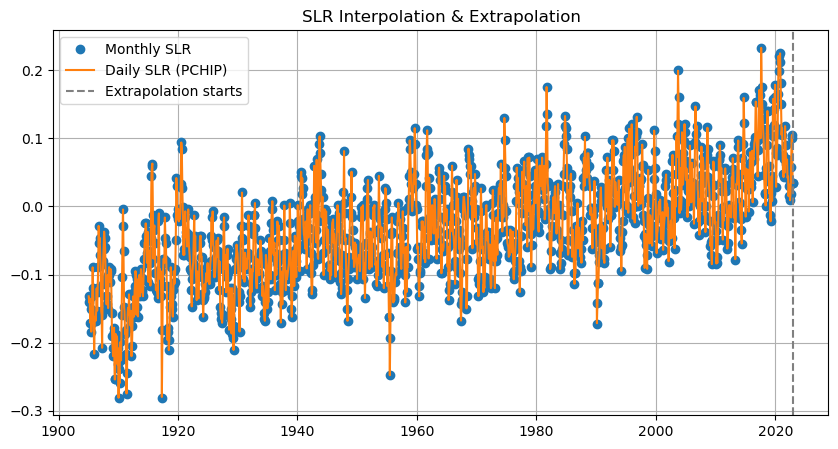

In [8]:
plt.figure(figsize=(10, 5))
plt.plot(monthly_dates, monthly_slr, 'o', label='Monthly SLR')
plt.plot(daily_dates, daily_slr, '-', label='Daily SLR (PCHIP)')
plt.axvline(dates_SLR.max(), color='gray', linestyle='--', label='Extrapolation starts')
plt.legend()
plt.grid(True)
plt.title("SLR Interpolation & Extrapolation")
plt.show()


In [9]:
print(daily_slr_df['date'].min(), daily_slr_df['date'].max())
print(daily_slr_df.shape)

1905-01-16 05:17:31.200000 2022-12-31 05:17:31.200000
(43084, 2)


In [10]:
mask = (daily_slr_df['date'] >= start_date) & (daily_slr_df['date'] <= end_date)
filtered_slr = daily_slr_df[mask].reset_index(drop=True)
print(filtered_slr.shape)  # ✅ Tu devrais voir (1096, 2)

(1098, 2)


In [11]:
daily_SLR = filtered_slr['slr_m']
print(daily_SLR)

0       0.134465
1       0.131152
2       0.127838
3       0.124525
4       0.121212
          ...   
1093    0.035000
1094    0.035000
1095    0.035000
1096    0.035000
1097    0.035000
Name: slr_m, Length: 1098, dtype: float64


In [12]:
print(wave_data['Sn079'])

              Time  SerialYear  SWH_max  SWH_mean  Period_mean    Dir_mean  \
0      01-Jan-1980      791980  3.51524  3.033860    11.331500  329.664375   
1      02-Jan-1980      791980  3.45200  2.791870    12.143263  336.542875   
2      03-Jan-1980      791980  2.27807  2.084290    11.439362  351.942250   
3      04-Jan-1980      791980  2.19920  2.087710    13.838738  341.840500   
4      05-Jan-1980      791980  2.10893  1.894022    13.259037  343.783250   
...            ...         ...      ...       ...          ...         ...   
14971  27-Dec-2020      792020  2.33684  1.994916    11.624588    0.036875   
14972  28-Dec-2020      792020  1.73058  1.463893    14.168450  345.275250   
14973  29-Dec-2020      792020  2.98383  2.364561    19.397150  315.728500   
14974  30-Dec-2020      792020  3.58991  3.445426    16.910625  310.936750   
14975  31-Dec-2020      792020  3.38109  3.149993    15.958200  313.422375   

             Lon        Lat  
0     -158.06939  21.674445  
1  

In [13]:
# Dictionary to store results
future_wave_data_by_station = {}

# Define common future date range
future_days = pd.date_range(start='2021-1-1', end='2023-01-01', freq='D')
future_df = pd.DataFrame({'time': future_days})
future_df['month'] = future_df['time'].dt.month
future_df['day'] = future_df['time'].dt.day
future_df['year'] = future_df['time'].dt.year

# Loop over each station
for station_id, df_hist in wave_data.items():
    print(f"Bootstrapping for {station_id}...")

    df_hist = df_hist.copy()
    df_hist['time'] = pd.to_datetime(df_hist['Time'])
    df_hist['month'] = df_hist['time'].dt.month
    df_hist['day'] = df_hist['time'].dt.day
    df_hist['year'] = df_hist['time'].dt.year

    future_wave_data = []

    for year in future_df['year'].unique():
        for month in range(1, 13):
            future_days_this_month = future_df[
                (future_df['year'] == year) & (future_df['month'] == month)
            ]

            df_month = df_hist[df_hist['month'] == month]
            if df_month.empty:
                continue

            sampled_year = np.random.choice(df_month['year'].unique())
            hist_sample = df_month[df_month['year'] == sampled_year].copy()

            hist_sample = hist_sample.sort_values('day').reset_index(drop=True)
            future_days_this_month = future_days_this_month.sort_values('day').reset_index(drop=True)

            min_len = min(len(hist_sample), len(future_days_this_month))
            hist_sample = hist_sample.iloc[:min_len]
            future_days_this_month = future_days_this_month.iloc[:min_len]

            hist_sample['time'] = future_days_this_month['time']
            future_wave_data.append(hist_sample)

    df_future = pd.concat(future_wave_data).sort_values('time').reset_index(drop=True)
    df_future = df_future.drop(columns=['month', 'day', 'year'], errors='ignore')

    # Store result
    future_wave_data_by_station[station_id] = df_future
    future_wave_data_by_station[station_id] = future_wave_data_by_station[station_id].drop(columns=['Time'], errors='ignore')


Bootstrapping for Sn079...
Bootstrapping for Sn080...
Bootstrapping for Sn081...
Bootstrapping for Sn082...


In [14]:
# Store combined data
extended_wave_data = {}

for station_id in wave_data.keys():
    print(f"Combining historical + future for {station_id}...")

    # 1. Historical
    df_hist = wave_data[station_id].copy()
    df_hist['time'] = pd.to_datetime(df_hist['Time'])
    df_hist_filtered = df_hist[(df_hist['time'] >= start_date)]

    # 2. Future (already covers 2021–2023)
    df_future = future_wave_data_by_station[station_id].copy()

    # 3. Concatenate
    df_extended = pd.concat([df_hist_filtered, df_future], ignore_index=True)
    df_extended = df_extended.sort_values('time').reset_index(drop=True)
    print(f"{station_id} → time steps: {len(df_extended)}")  # Should be 1096

    # 4. Store
    extended_wave_data[station_id] = df_extended
    extended_wave_data[station_id] = extended_wave_data[station_id].drop(columns=['Time'], errors='ignore')


Combining historical + future for Sn079...
Sn079 → time steps: 1099
Combining historical + future for Sn080...
Sn080 → time steps: 1099
Combining historical + future for Sn081...
Sn081 → time steps: 1099
Combining historical + future for Sn082...
Sn082 → time steps: 1099


In [15]:
# Sort stations to keep order consistent
station_ids = sorted(extended_wave_data.keys())

# Initialize list containers
Hs_list = []
Tp_list = []
Dir_list = []
coords_list = []

# Loop through stations
for station_id in station_ids:
    df = extended_wave_data[station_id]
    
    # Store time series data
    Hs_list.append(df['SWH_mean'].values)
    Tp_list.append(df['Period_mean'].values)
    Dir_list.append(df['Dir_mean'].values)
    
    # Extract unique coordinates
    lat = df['Lat'].iloc[0]
    lon = df['Lon'].iloc[0]
    coords_list.append([lat, lon])

# Stack lists into 2D arrays: shape (time, station)
Hs_array = np.column_stack(Hs_list)
Tp_array = np.column_stack(Tp_list)
Dir_array = np.column_stack(Dir_list)

# Coordinates array: shape (station, 2)
coords_array = np.array(coords_list)

In [16]:
# Convert list of 1D arrays into a 2D array
Hs_array = np.stack(Hs_list, axis=1)  # shape = (T, N)
Tp_array = np.stack(Tp_list, axis=1)
Dir_array = np.stack(Dir_list, axis=1)

In [17]:
Hs = Hs_array[:-1,:]
Tp = Tp_array[:-1,:]
Dir = Dir_array[:-1,:]

In [18]:
import pyproj
proj = pyproj.Transformer.from_crs("EPSG:26904", "EPSG:4326", always_xy=True)
lon_off, lat_off = proj.transform(x_off[1295:1345], y_off[1295:1345])
lon_on, lat_on   = proj.transform(x_on[1295:1345], y_on[1295:1345])

In [19]:
import contextily as cx

# Define index range
idx_start, idx_end = 1295, 1346

# 1. Slice first
x_on_sub  = x_on[idx_start:idx_end]
y_on_sub  = y_on[idx_start:idx_end]
x_off_sub = x_off[idx_start:idx_end]
y_off_sub = y_off[idx_start:idx_end]
angle    = angle[idx_start:idx_end]

# Midpoints of transects
x_mid = (x_off_sub + x_on_sub) / 2
y_mid = (y_off_sub + y_on_sub) /2

# 2. Convert to lat/lon
proj_to_latlon = pyproj.Transformer.from_crs("EPSG:26904", "EPSG:4326", always_xy=True)

lon_mid,lat_mid  = proj_to_latlon.transform(x_mid,y_mid)

# 3. Convert to Web Mercator
proj_to_web = pyproj.Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
x_on_web, y_on_web   = proj_to_web.transform(lon_on, lat_on)
x_off_web, y_off_web = proj_to_web.transform(lon_off, lat_off)
x_mid_web,y_mid_web  = proj_to_web.transform(lon_mid, lat_mid)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


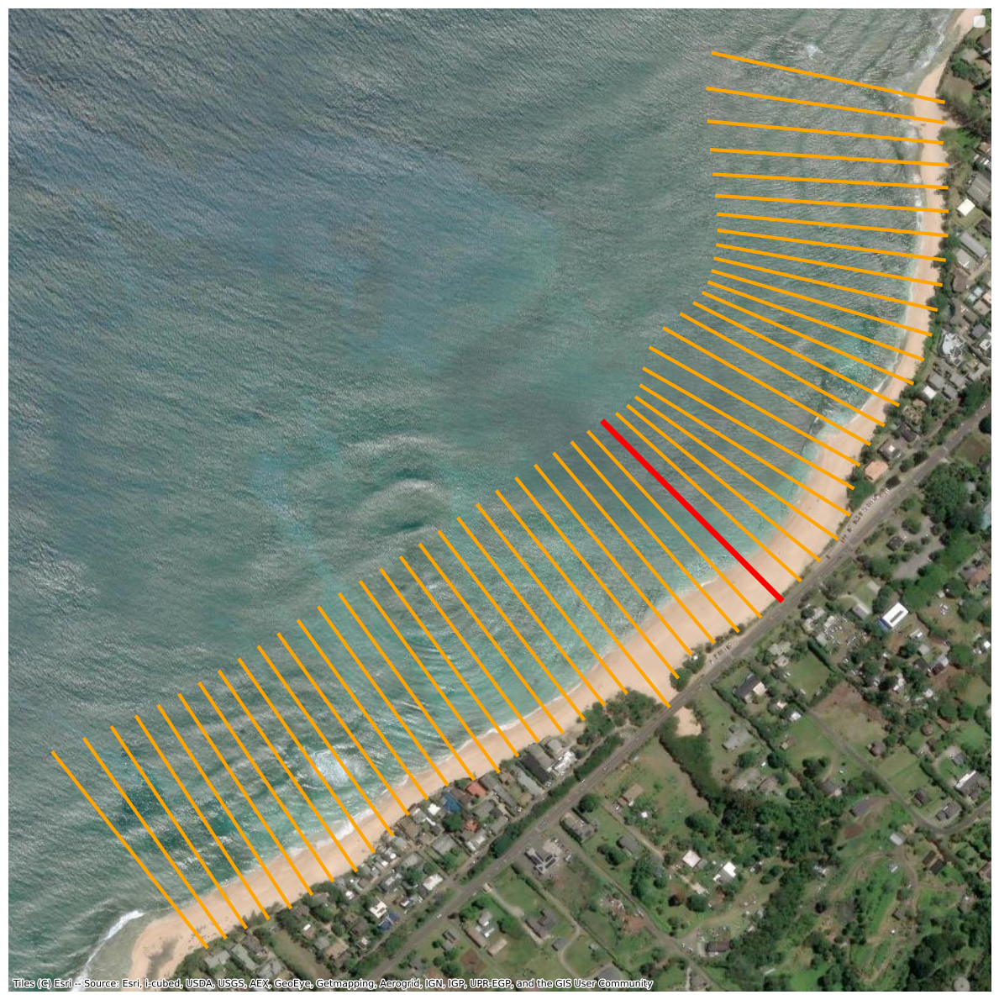

In [20]:
fig, ax = plt.subplots(figsize=(12, 12))
d = 35  # distance en mètres

for i in range(len(x_on_web)):
    angle_rad = np.deg2rad(angle[i])
    dx = d * np.cos(angle_rad)
    dy = d * np.sin(angle_rad)

    x_shifted = x_on_web[i] + dx
    y_shifted = y_on_web[i] + dy

    if i == 27:  # Identifier le transect 1323
        ax.plot(
            [x_on_web[i], x_off_web[i]],
            [y_on_web[i], y_off_web[i]],
            color='red', linewidth=5
        )
#         ax.scatter(x_shifted, y_shifted, c='red', s=100)
    else:
        ax.plot(
            [x_on_web[i], x_off_web[i]],
            [y_on_web[i], y_off_web[i]],
            color='orange', lw=3
        )
#         ax.scatter(x_shifted, y_shifted, c='red')

cx.add_basemap(ax, crs="EPSG:3857", source=cx.providers.Esri.WorldImagery)
ax.set_axis_off()
ax.legend(fontsize=12)
plt.tight_layout()
plt.show()


In [21]:
Y0_corr = []

for i in range(len(x_on_web)):
    angle_rad = np.deg2rad(angle[i])

    # Déplacement de -35 m le long du transect
    x_corr = x_on_web[i] + (-35) * np.cos(angle_rad)
    y_corr = y_on_web[i] + (-35) * np.sin(angle_rad)

    # Projeter le point corrigé sur le transect
    dx = x_corr - x_on_web[i]
    dy = y_corr - y_on_web[i]
    Y_corr = dx * np.cos(angle_rad) + dy * np.sin(angle_rad)

    Y0_corr.append(Y_corr)

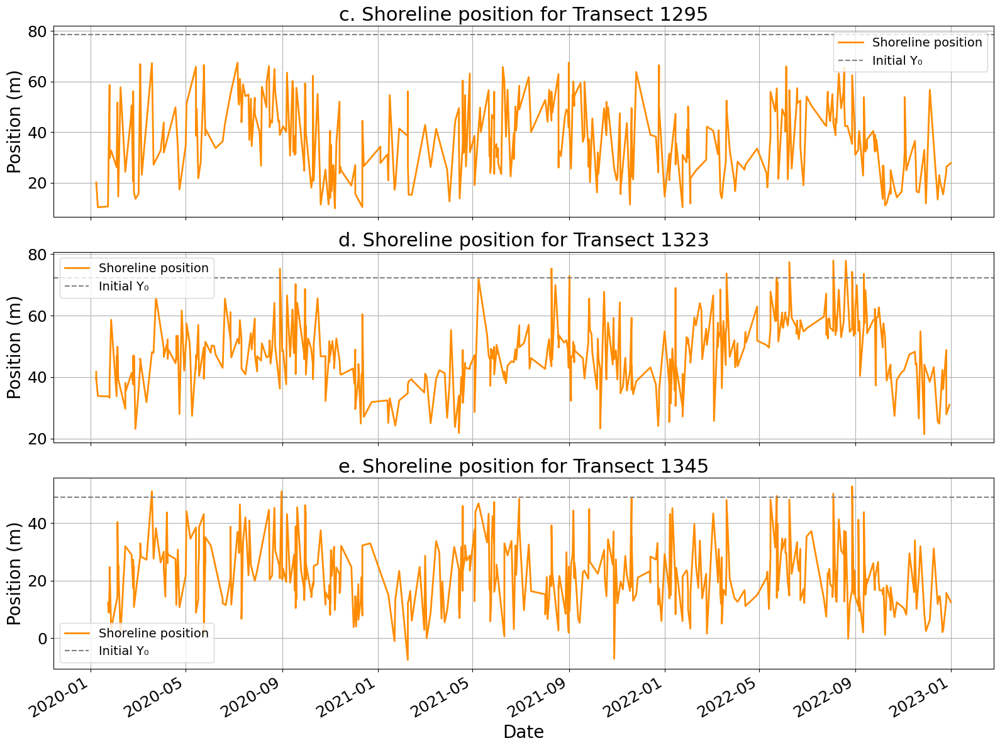

In [22]:
# Extract data for transects
ids = [1295, 1323, 1345]
transect_data = {}

for tid in ids:
    dates_dt, shoreline, Y0 = extract_transect_data(TRANSECTS, transect_ids, tid)
    transect_data[tid] = (dates_dt, shoreline, Y0)

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(16, 12), sharex=True)
labels = ['c.', 'd.', 'e.']

for i, tid in enumerate(ids):
    dates, shoreline, Y0 = transect_data[tid]
    ax = axs[i]

    # Plot shoreline position
    ax.plot(dates, shoreline, linestyle='-', color='darkorange', label='Shoreline position', linewidth=2)

    # Plot Y0 as a horizontal line
    ax.axhline(Y0, color='gray', linestyle='--', label='Initial Y₀')

    # Styling
    ax.set_ylabel("Position (m)", fontsize=20)
    ax.set_title(f"{labels[i]} Shoreline position for Transect {tid}", loc='center', fontsize=22)
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.grid(True)
    ax.legend(fontsize=14)

# Shared X-axis
axs[-1].set_xlabel("Date", fontsize=20)
fig.autofmt_xdate()
plt.tight_layout()
plt.show()


## Validation data - CoastSat

In [23]:
Y0_list = []
sat_dates_all = []
sat_Y_all = []

transect_ids_all = np.arange(1295, 1346)

for tid in transect_ids_all:
    try:
        dates, shoreline, Y0 = extract_transect_data(TRANSECTS, transect_ids, tid)
        Y0_list.append(Y0)
        sat_dates_all.append(dates)      # ← liste de listes
        sat_Y_all.append(shoreline)      # ← liste de listes
    except Exception as e:
        print(f"❌ Error for transect {tid}: {e}")
        Y0_list.append(np.nan)
        sat_dates_all.append(None)
        sat_Y_all.append(None)


In [24]:
df_Y0 = pd.DataFrame({
    'Transect_ID': transect_ids_all,
    'Y0': Y0_list
})

In [25]:
print(sat_dates_all)

[[datetime.datetime(2020, 1, 7, 20, 46, 31, 3), datetime.datetime(2020, 1, 9, 21, 19, 0, 2), datetime.datetime(2020, 1, 22, 19, 28, 57), datetime.datetime(2020, 1, 24, 19, 30, 37), datetime.datetime(2020, 1, 24, 20, 47, 49, 999997), datetime.datetime(2020, 1, 24, 21, 19, 0, 2), datetime.datetime(2020, 1, 26, 19, 31, 4, 5), datetime.datetime(2020, 2, 2, 19, 27, 5, 999998), datetime.datetime(2020, 2, 3, 20, 35, 12, 4), datetime.datetime(2020, 2, 3, 21, 19, 0, 2), datetime.datetime(2020, 2, 4, 21, 2, 22, 210001), datetime.datetime(2020, 2, 7, 19, 26, 19, 999996), datetime.datetime(2020, 2, 13, 21, 19, 0, 2), datetime.datetime(2020, 2, 20, 20, 48, 15, 999996), datetime.datetime(2020, 2, 21, 21, 20, 19, 420000), datetime.datetime(2020, 2, 23, 19, 26, 4, 3), datetime.datetime(2020, 2, 23, 21, 19, 0, 2), datetime.datetime(2020, 2, 23, 21, 21, 31, 410004), datetime.datetime(2020, 2, 24, 21, 22, 36, 349996), datetime.datetime(2020, 2, 26, 19, 24, 5, 4), datetime.datetime(2020, 3, 1, 19, 25, 5, 

# TRANSECT LON/LAT

In [26]:
# Convert transect_ids to an integer NumPy array if it's not already
transect_ids = transect_ids.astype(int)

# Get boolean mask for IDs in the range [1295, 1345]
mask = (transect_ids >= 1295) & (transect_ids <= 1345)

# Get the indexes where the mask is True
selected_indexes = np.where(mask)[0]

In [27]:
# Extract data for transects
ids_GC = np.arange(1295,1346)
transect_data_GC_sat = {}

for tid in ids_GC:
    dates_dt, shoreline,Y0 = extract_transect_data(TRANSECTS, transect_ids, tid)
    transect_data_GC_sat[tid] = (dates_dt, shoreline,Y0)

In [28]:
start_date = datetime(2019, 12, 30)
end_date = datetime(2022, 12, 31)

model_dates = pd.date_range(start=start_date, end=end_date, freq="D")

# Calculate number of days
num_days = (end_date - start_date).days +1
print(f"Number of days: {num_days}")

Number of days: 1098


In [29]:
# On fait un point
# 1. La pente de plage, constante dans le temps, je devrais en avoir une par position (i.e. 51)
slope = lin_interp[1295:1346].flatten()
print(slope.shape)

#2. SLR il est constant par position j'ai une valeur pour chaque pas de temps (i.e. 1098)
SLR = daily_SLR
print(SLR.shape)

#3. Shoreline change initial Ychange_0 from cosmos coast (i.e. 51)
print(df_Y0.shape)

#4. Lon et lat on prends le milieu pour avoir plus ou moins la ligne d'eau (i.e. 51)
# print(lat_mid_GC.shape)
# print(lon_mid_GC.shape)

print(x_on_sub.shape)
print(y_on_sub.shape)
#5. Waves pour l'instant j'ai les 4 transects de références donc je devrais entre en 1098*4
print(Hs.shape)
print(Tp.shape)
print(Dir.shape) # attention au dir --> cartésien ou Nautical ?

#5b.on va devoir projeter les series de vagues sur les autres positions
num_days, num_wave_series = Hs.shape
num_transects = len(x_on_sub)

# Création d'une matrice vide pour Hs pleine
Hs_full = np.zeros((num_days, num_transects))
Tp_full = np.zeros((num_days, num_transects))
Dir_full = np.zeros((num_days, num_transects))

# Exemple d'affectation : les clés sont les colonnes de Hs à utiliser
# et les valeurs les intervalles de transects concernés
wave_to_transects = {
    0: range(0, 15),     # transects 0 à 3 → Hs[:,0]
    1: range(15, 34),    # transects 4 à 24 → Hs[:,1]
    2: range(34, 40),   # transects 25 à 37 → Hs[:,2]
    3: range(40, 51)    # transects 38 à 50 → Hs[:,3]
}

# Remplissage
for wave_col, transect_ids in wave_to_transects.items():
    Hs_full[:, transect_ids] = Hs[:, wave_col][:, None]
    Tp_full[:, transect_ids] = Tp[:, wave_col][:, None]
    Dir_full[:, transect_ids] = Dir[:, wave_col][:, None]

print(Hs_full.shape)
print(Tp_full.shape)
print(Dir_full.shape)

(51,)
(1098,)
(51, 2)
(51,)
(51,)
(1098, 4)
(1098, 4)
(1098, 4)
(1098, 51)
(1098, 51)
(1098, 51)


# GLOBCOASTS

In [30]:
# CONSTANT VALUES DECLARATION
print("# - Initializing constant values...")

# Median grain size [m]
d50 = 0.47*10e-3 #0.47mm

# Sand porosity
poro = 0.4

# Sand density [kg/m3]
rohs      = 2650 

# Water density [kg/m3]
roh       = 1000 

# gravitationnal acceleration [m/s2]
g = 9.81

# Earth radius [m]
R = 6371000

# Depth of closure [m]
DoC    = 10 

# Time step [day]
dt=1
Ndays = num_days

# Geographical referentiel 
geod = Geod(ellps="WGS84")

# - Initializing constant values...


In [31]:
### TIDE FROM SIMON

TIDE = pd.read_csv(
    INPUT + 'predictions-2019_2023-Hawai.dat',
    delim_whitespace=True,
    skiprows=2,                  # saute l'en-tête
    usecols=[1, 3],              # datetime et élévation
    header=None,
    names=['datetime', 'elevation'],
    parse_dates=['datetime']    # convertit automatiquement en datetime
)

In [32]:
# S'assurer que datetime est bien l'index
TIDE.set_index('datetime', inplace=True)

# Regrouper par jour et prendre le maximum
TIDE_daily_max = TIDE.resample('D').mean()
tide = TIDE_daily_max['elevation']
TIDE_daily_max_filtered = TIDE_daily_max.loc[start_date:end_date]
filtered_array = TIDE_daily_max_filtered['elevation'].to_numpy()
tide_daily= filtered_array
tide_daily = tide_daily[:, np.newaxis]  # devient (1098, 1)


In [33]:
# wave length
L_SU = (g/(2*np.pi))*Tp_full**2                                                      

# foreshore slope (Arias et al., 2024)
beta       = 0.12 * ((np.sqrt(2*np.pi*d50*L_SU))/(Hs_full * (1+(tide_daily/Hs_full))))**(1/2)

## Calibration coefficient c 

In [34]:
# ==============================
# Build CoastSat validation matrix (DAILY GRID)
# ==============================

model_dates = pd.to_datetime(model_dates)
n_time = len(model_dates)

transect_ids_all = np.arange(1295, 1346)
n_transects = len(transect_ids_all)

Xsat_val = np.full((n_time, n_transects), np.nan)

# numeric model time (seconds since epoch)
t_mod = model_dates.view("int64") // 10**9

for j, (d_list, y_list) in enumerate(zip(sat_dates_all, sat_Y_all)):
    if d_list is None or y_list is None:
        continue

    d_arr = pd.to_datetime(d_list)
    y_arr = np.array(y_list, dtype=float)

    mask = np.isfinite(y_arr)
    if mask.sum() < 2:
        continue

    t_obs = d_arr.view("int64")[mask] // 10**9
    y_obs = y_arr[mask]

    try:
        Xsat_val[:, j] = np.interp(t_mod, t_obs, y_obs)
    except Exception as e:
        print(f"Interpolation failed for transect index {j}: {e}")


In [35]:
print(Xsat_val.shape)
print(SLR.shape)
print(beta.shape)

print(np.where(np.isnan(Xsat_val)))
print(np.where(np.isnan(SLR)))
print(np.where(np.isnan(beta)))

(1098, 51)
(1098,)
(1098, 51)
(array([], dtype=int64), array([], dtype=int64))
(array([], dtype=int64),)
(array([], dtype=int64), array([], dtype=int64))


In [59]:
# ==============================
# Calibration loop over transects (with fallback)
# ==============================

results = {}
skipped_indices = []

c_opt_array = np.full(n_transects, np.nan)

c_min, c_max = -0.7, 0.7       # keep c positive and away from zero
c0 = 0.1                       # initial guess
sigma_smooth = 30.0            # smoothing in days (for daily data)

dates = model_dates            # daily DatetimeIndex

for j in range(n_transects):

    # ---------- 1. Try local optimization ----------
    best_c = c0
    best_cost = 1e9  # very large

    res = minimize(
        objective_function,
        x0=[c0],
        args=(SLR, beta, Xsat_val, j, sigma_smooth, dates, skipped_indices),
        bounds=[(c_min, c_max)],
        method="L-BFGS-B",
    )

    if np.isfinite(res.fun):
        best_c = float(res.x[0])
        best_cost = float(res.fun)

    # ---------- 2. Fallback: coarse grid search ----------
    grid_cs = np.linspace(c_min, c_max, 25)  # 25 trial values

    for c_try in grid_cs:
        cost_try = objective_function(
            c_try, SLR, beta, Xsat_val, j, sigma_smooth, dates, skipped_indices
        )
        if np.isfinite(cost_try) and cost_try < best_cost:
            best_cost = float(cost_try)
            best_c = float(c_try)

    # At this point we *always* have a finite best_c and best_cost
    c_opt = best_c
    c_opt_array[j] = c_opt

    # ---------- 3. Compute diagnostics with c_opt ----------
    X_opt = run_dynamic_slope_model(c_opt, SLR, beta, j)

    X_opt_detrend = detrend_linear(X_opt)
    X_opt_smooth  = gaussian_smooth_1d(X_opt_detrend, sigma_smooth)

    val_series = Xsat_val[:, j]
    val_detrend = detrend_linear(val_series)
    val_smooth  = gaussian_smooth_1d(val_detrend, sigma_smooth)

    df_model = pd.DataFrame(X_opt_smooth, index=dates, columns=["model"])
    df_sat   = pd.DataFrame(val_smooth, index=dates, columns=["sat"])

    clim_model = compute_monthly_climatology(df_model)
    clim_sat   = compute_monthly_climatology(df_sat)

    results[j] = {
        "c_opt": c_opt,
        "clim_model": clim_model,
        "clim_sat": clim_sat,
        "std_cost": best_cost,
    }

print("NaNs in c_opt_array after calibration:",
      np.isnan(c_opt_array).sum(), "/", n_transects)


NaNs in c_opt_array after calibration: 0 / 51


In [60]:
# ==============================
# Build c_opt array AFTER calibration
# ==============================

c_opt_array = np.full(n_transects, np.nan)

for j in range(n_transects):
    if j in results:
        c_opt_array[j] = results[j]["c_opt"]

print("c_opt_array shape:", c_opt_array.shape)
print("First 10 values:", c_opt_array[:10])

print("Skipped transects:", skipped_indices)
print(f"{np.sum(np.isnan(c_opt_array))} / {n_transects} transects could not be calibrated")

c_opt_array shape: (51,)
First 10 values: [-0.08709169 -0.11666667 -0.11666667 -0.17270904 -0.17943246 -0.18050335
 -0.1811063  -0.175       0.19554022  0.15322611]
Skipped transects: []
0 / 51 transects could not be calibrated


In [76]:
import matplotlib.dates as mdates
def plot_transect_example(j, sigma_plot=30.0):
    """
    Plot daily shoreline anomalies + monthly climatologies
    for a given transect index j.
    """
    if j not in results:
        print(f"Transect index {j} not in results (maybe skipped).")
        return
    
    # Optional: map index -> real transect ID if you have it
    try:
        transect_id = transect_ids_all[j]
    except NameError:
        transect_id = j  # fallback
    
    # --- 1. Get calibrated model + satellite (daily) ---
    c_opt = results[j]["c_opt"]
    X_model = run_dynamic_slope_model(c_opt, SLR, beta, j)
    X_sat   = Xsat_val[:, j]

    # detrend + smooth for nicer plotting
    X_model_d = detrend_linear(X_model)
    X_sat_d   = detrend_linear(X_sat)

    X_model_s = gaussian_smooth_1d(X_model_d, sigma_plot)
    X_sat_s   = gaussian_smooth_1d(X_sat_d, sigma_plot)

    # --- 2. Get monthly climatologies (already stored in results) ---
    clim_model = results[j]["clim_model"]["model"]
    clim_sat   = results[j]["clim_sat"]["sat"]

    months = clim_model.index  # "Jan", "Feb", ...

    # --- 3. Make the figure ---
    fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=False)

    # Top: daily time series (smoothed)
    ax = axes[0]
    ax.plot(model_dates, X_sat_s, label="Satellite", color="orange", linewidth=1.5)
    ax.plot(model_dates, X_model_s, label="Model", color="violet", linewidth=1.5)

    ax.set_title(f"Transect {transect_id} – Daily shoreline position (Y)", fontsize=18)
    ax.set_ylabel("Shoreline position (m)", fontsize=16)
    ax.legend(loc="best", fontsize=16)
    ax.grid(True, alpha=0.3)

    # ✅ Bigger Y ticks
    ax.tick_params(axis='y', labelsize=16)

    # ✅ Date format: DD_MM_YYYY
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d_%m_%Y'))
    ax.tick_params(axis='x', rotation=45, labelsize=16)

    # Bottom: monthly climatology
    ax2 = axes[1]
    ax2.plot(months, clim_sat.values, label="Satellite climatology", color="orange")
    ax2.plot(months, clim_model.values, label="Model climatology", color="violet")

    ax2.set_title("b. Monthly climatology (2019–2022)", fontsize=18)
    ax2.set_ylabel("Shoreline position (m)", fontsize=16)
    ax2.set_xlabel("Month", fontsize=16)
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc="best", fontsize=16)

    # ✅ Bigger Y ticks for bottom plot
    ax2.tick_params(axis='y', labelsize=16)

    ax2.set_xticks(months)
    ax2.set_xticklabels(months, rotation=45, fontsize=16)

    plt.tight_layout()
    plt.show()
    
    return X_sat_s, X_model_s

In [77]:
def calculate_metrics2(Yobs, Ymod):
    Yobs = np.array(Yobs)
    Ymod = np.array(Ymod)

    # Remove NaNs safely
    mask = np.isfinite(Yobs) & np.isfinite(Ymod)
    Yobs = Yobs[mask]
    Ymod = Ymod[mask]

    # RMSE
    rmse = np.sqrt(np.mean((Ymod - Yobs) ** 2))

    # Willmott's Index of Agreement
    Yobs_mean = np.mean(Yobs)
    numerator = np.sum((Ymod - Yobs) ** 2)
    denominator = np.sum((np.abs(Ymod - Yobs_mean) + np.abs(Yobs - Yobs_mean)) ** 2)
    d_index = 1 - (numerator / denominator)

    # Correlation
    corr = np.corrcoef(Yobs, Ymod)[0, 1]

    return rmse, d_index, corr


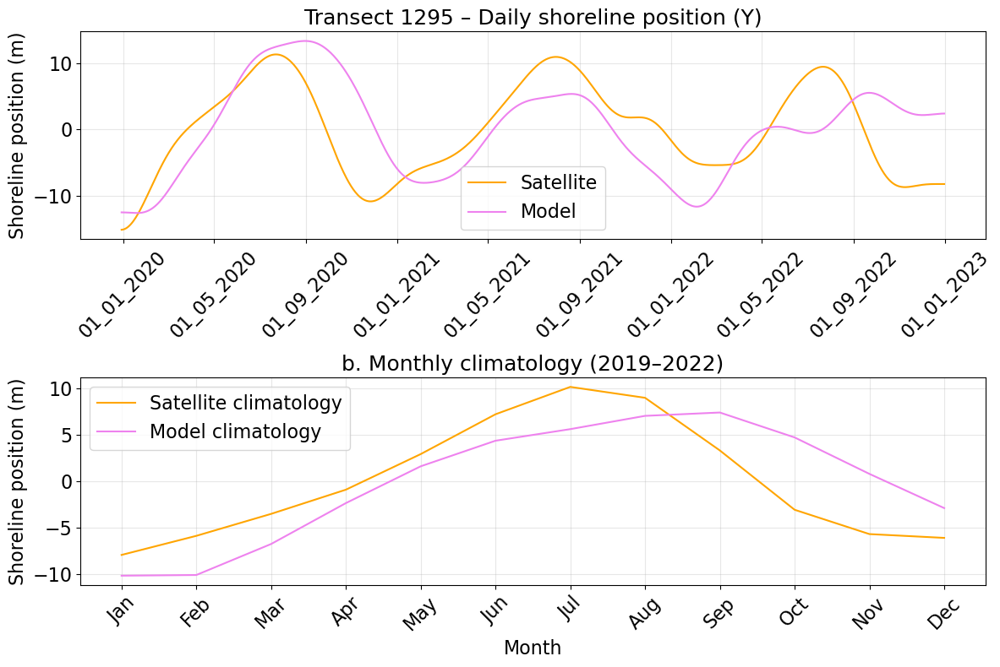

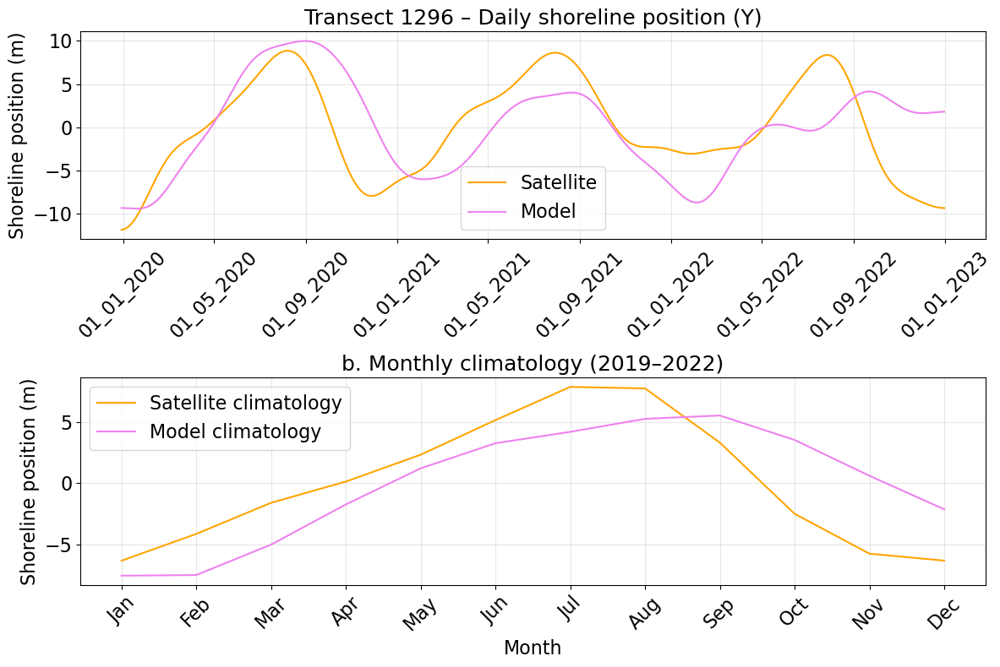

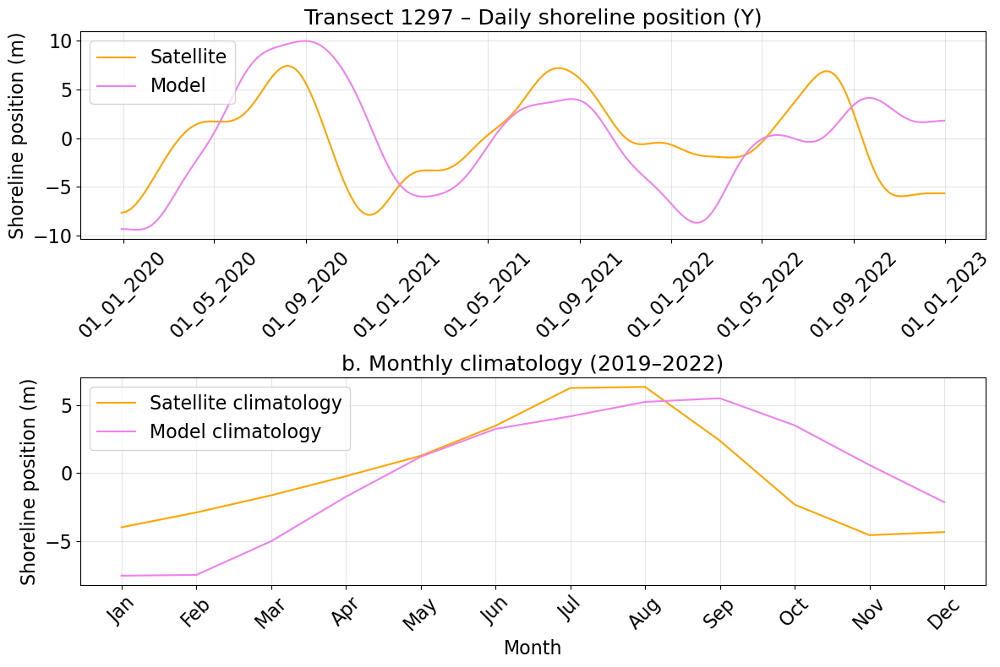

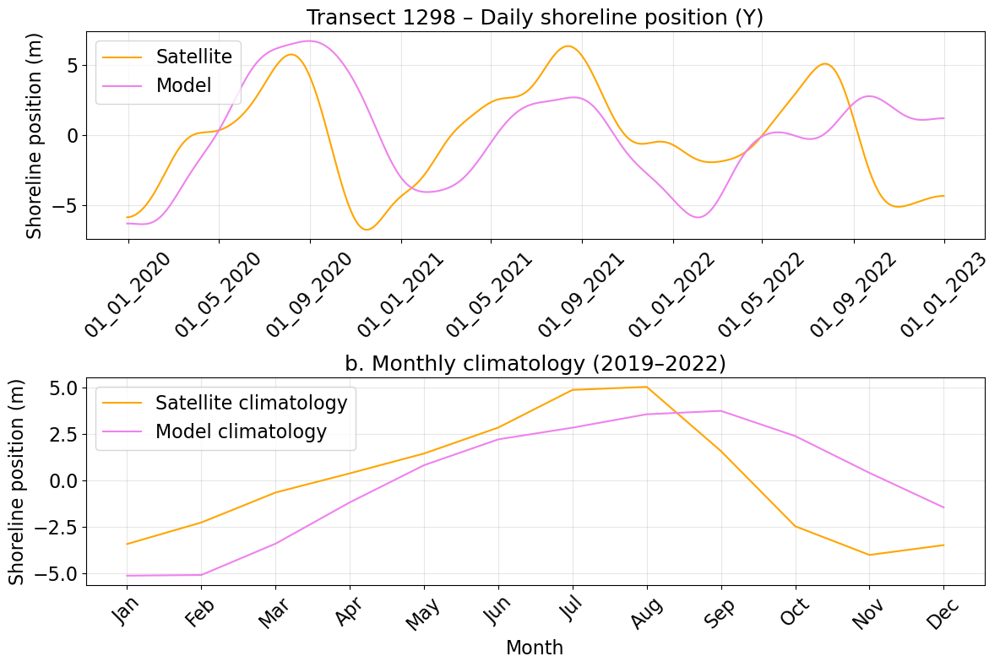

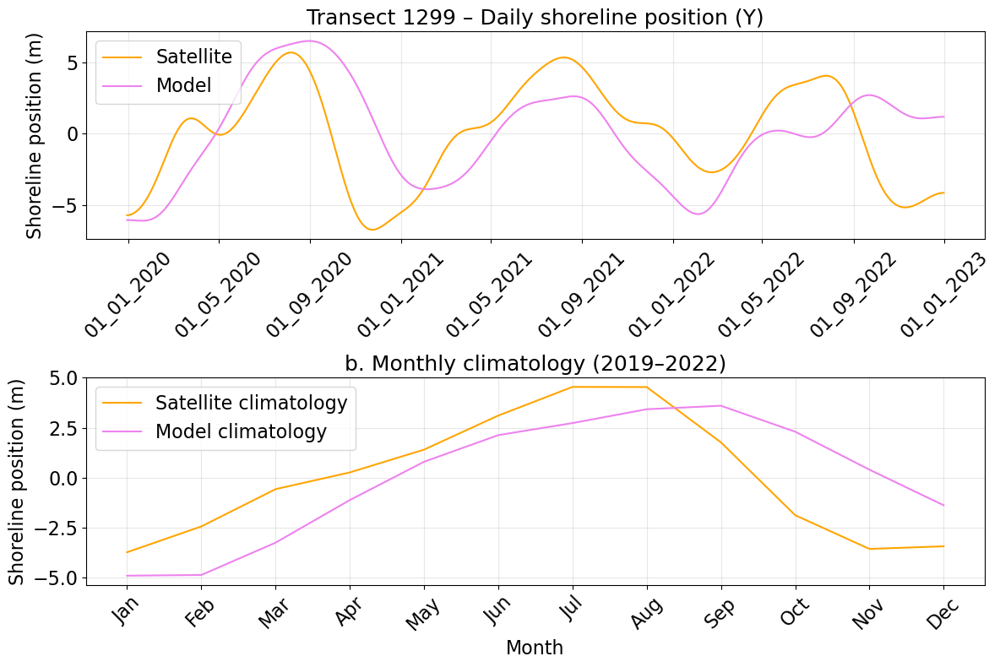

...

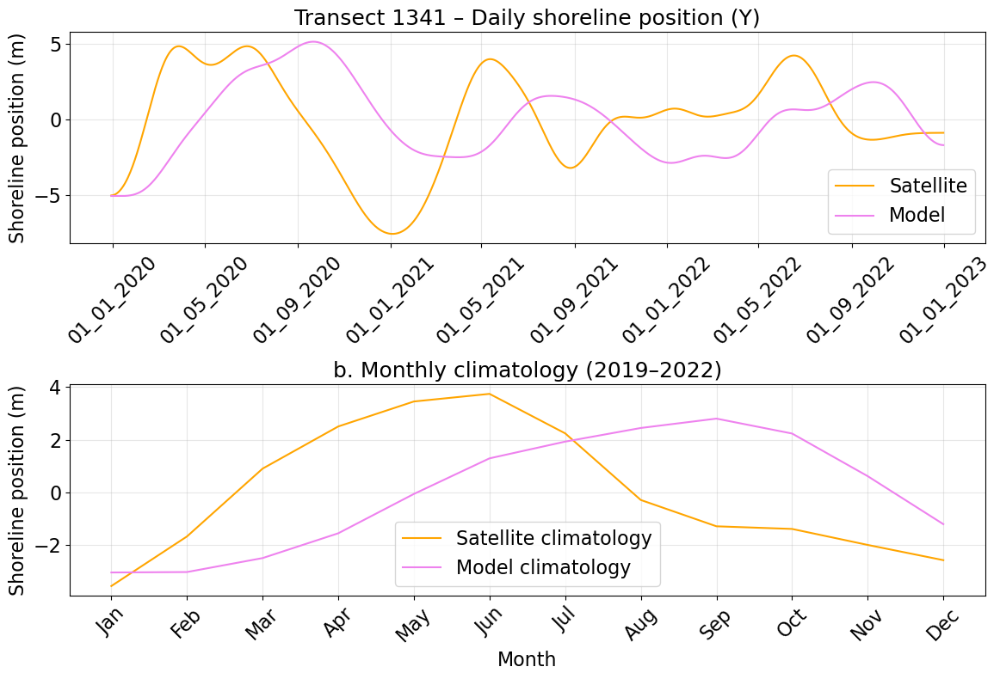

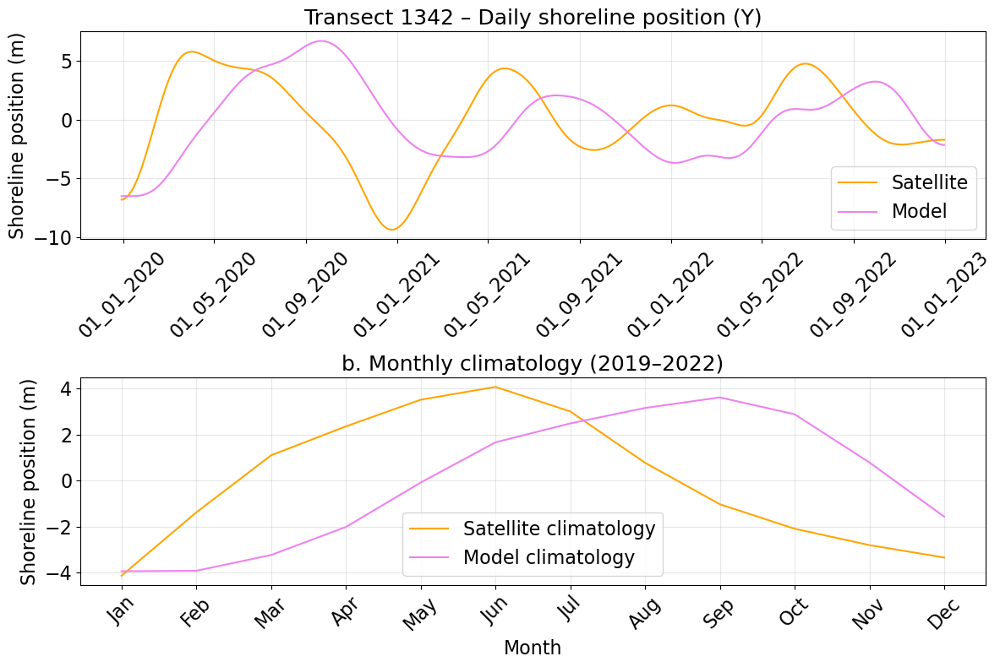

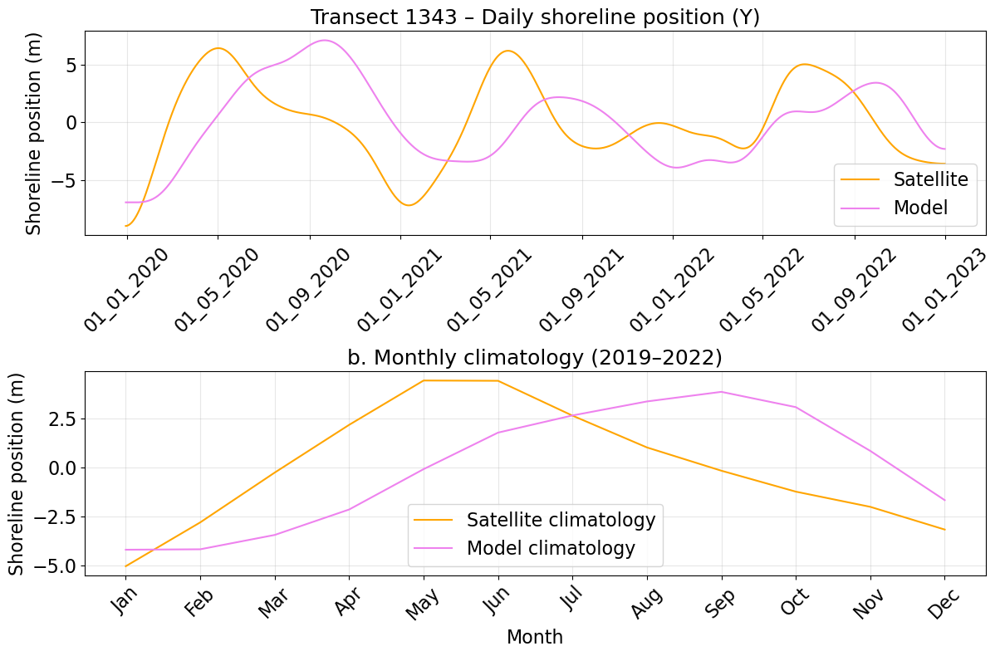

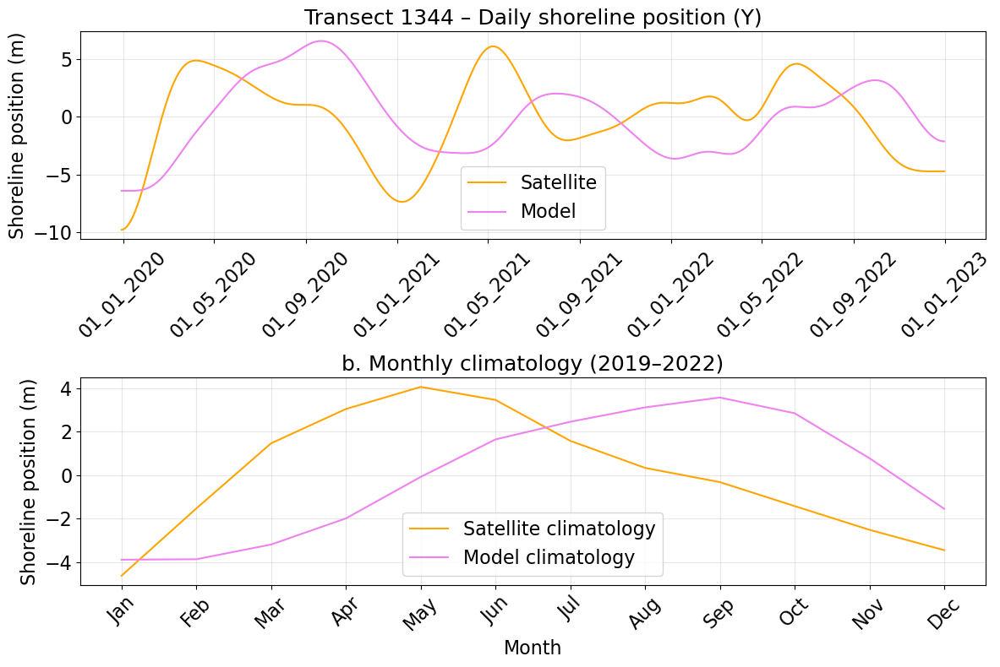

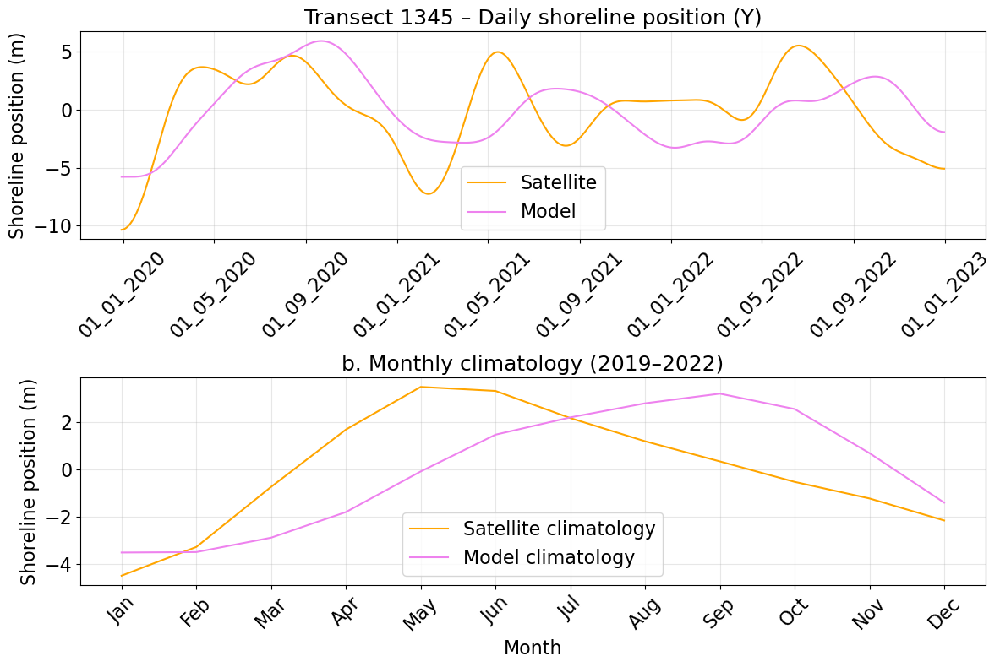

In [85]:
transects_to_plot = np.arange(0,51)

Xsat_store   = {}
Xmodel_store = {}

for j in transects_to_plot:
    X_sat_s, X_model_s = plot_transect_example(j, sigma_plot=30.0)

    Xsat_store[j]   = X_sat_s
    Xmodel_store[j] = X_model_s

In [86]:
def calculate_metrics(Yobs, Ymod):
    Yobs = np.asarray(Yobs)
    Ymod = np.asarray(Ymod)

    # Remove NaNs safely
    mask = np.isfinite(Yobs) & np.isfinite(Ymod)
    Yobs = Yobs[mask]
    Ymod = Ymod[mask]

    # RMSE
    rmse = np.sqrt(np.mean((Ymod - Yobs) ** 2))

    # Willmott's Index of Agreement
    Ymean = np.mean(Yobs)
    num = np.sum((Ymod - Yobs) ** 2)
    den = np.sum((np.abs(Ymod - Ymean) + np.abs(Yobs - Ymean)) ** 2)
    d_index = 1 - num / den

    # Pearson correlation
    corr = np.corrcoef(Yobs, Ymod)[0, 1]

    return rmse, d_index, corr


In [87]:
transects_to_plot = np.arange(0,51)

rmse_sel = {}
d_sel    = {}
corr_sel = {}

for j in transects_to_plot:

    # --- Get calibrated model + satellite (daily) ---
    c_opt = results[j]["c_opt"]
    X_model = run_dynamic_slope_model(c_opt, SLR, beta, j)
    X_sat   = Xsat_val[:, j]

    # detrend (NO smoothing for metrics)
    X_model_d = detrend_linear(X_model)
    X_sat_d   = detrend_linear(X_sat)

    # compute metrics
    rmse, d_index, corr = calculate_metrics(X_sat_d, X_model_d)

    # store
    rmse_sel[j] = rmse
    d_sel[j]    = d_index
    corr_sel[j] = corr

    # optional: print immediately
    print(
        f"Transect {j:2d} | "
        f"RMSE = {rmse:6.2f} m | "
        f"Willmott d = {d_index:.3f} | "
        f"Corr = {corr:.3f}"
    )


Transect  0 | RMSE =  15.67 m | Willmott d = 0.515 | Corr = 0.201
Transect  1 | RMSE =  12.60 m | Willmott d = 0.496 | Corr = 0.182
Transect  2 | RMSE =  11.64 m | Willmott d = 0.484 | Corr = 0.163
Transect  3 | RMSE =   9.90 m | Willmott d = 0.449 | Corr = 0.139
Transect  4 | RMSE =   9.46 m | Willmott d = 0.462 | Corr = 0.166
Transect  5 | RMSE =   9.63 m | Willmott d = 0.450 | Corr = 0.149
Transect  6 | RMSE =   9.37 m | Willmott d = 0.457 | Corr = 0.160
Transect  7 | RMSE =   9.98 m | Willmott d = 0.412 | Corr = 0.080
Transect  8 | RMSE =  10.38 m | Willmott d = 0.357 | Corr = 0.003
Transect  9 | RMSE =  11.01 m | Willmott d = 0.437 | Corr = 0.107
Transect 10 | RMSE =  11.28 m | Willmott d = 0.498 | Corr = 0.195
Transect 11 | RMSE =   9.74 m | Willmott d = 0.530 | Corr = 0.247
Transect 12 | RMSE =   8.54 m | Willmott d = 0.533 | Corr = 0.256
Transect 13 | RMSE =   8.15 m | Willmott d = 0.478 | Corr = 0.197
Transect 14 | RMSE =   8.34 m | Willmott d = 0.490 | Corr = 0.212
Transect 1

In [88]:
def multi_transect_figure(indices, c_default=0.1, sigma_plot=30.0):
    n = len(indices)
    fig, axes = plt.subplots(n, 1, figsize=(12, 3*n), sharex=True)

    if n == 1:
        axes = [axes]

    for ax, j in zip(axes, indices):
        if np.isnan(c_opt_array[j]):
            ax.text(0.5, 0.5, f"Transect {j}: no c_opt",
                    transform=ax.transAxes, ha="center", va="center")
            ax.set_axis_off()
            continue

        try:
            transect_id = transect_ids_all[j]
        except NameError:
            transect_id = j

        Y_sat = Xsat_val[:, j]
        X_pre = run_dynamic_slope_model(c_default, SLR, beta, j)
        X_post = run_dynamic_slope_model(c_opt_array[j], SLR, beta, j)

        Y_sat_s  = gaussian_smooth_1d(detrend_linear(Y_sat),  sigma_plot)
        X_pre_s  = gaussian_smooth_1d(detrend_linear(X_pre),  sigma_plot)
        X_post_s = gaussian_smooth_1d(detrend_linear(X_post), sigma_plot)

        ax.plot(model_dates, Y_sat_s,  label="Satellite", color="orange", linewidth=1.2)
        ax.plot(model_dates, X_pre_s,  label="Pre-cal",  color="violet", linewidth=1.0, alpha=0.8)
        ax.plot(model_dates, X_post_s, '--', label="Post-cal", color="violet", linewidth=1.3)

        # ✅ Bigger title
        ax.set_title(f"a. Transect {transect_id} - Daily shoreline position (Y)", fontsize=18)

        # ✅ Bigger X and Y ticks
        ax.tick_params(axis='x', labelsize=16)
        ax.tick_params(axis='y', labelsize=16)

        ax.grid(True, alpha=0.3)

    # ✅ Shared Y-axis label
        ax.set_ylabel("Shoreline position (m)", fontsize=16)
        ax.legend(loc="upper right", fontsize=14)

    # ✅ Bigger X-axis label
    axes[-1].set_xlabel("Date", fontsize=16)

    plt.tight_layout()
    plt.show()


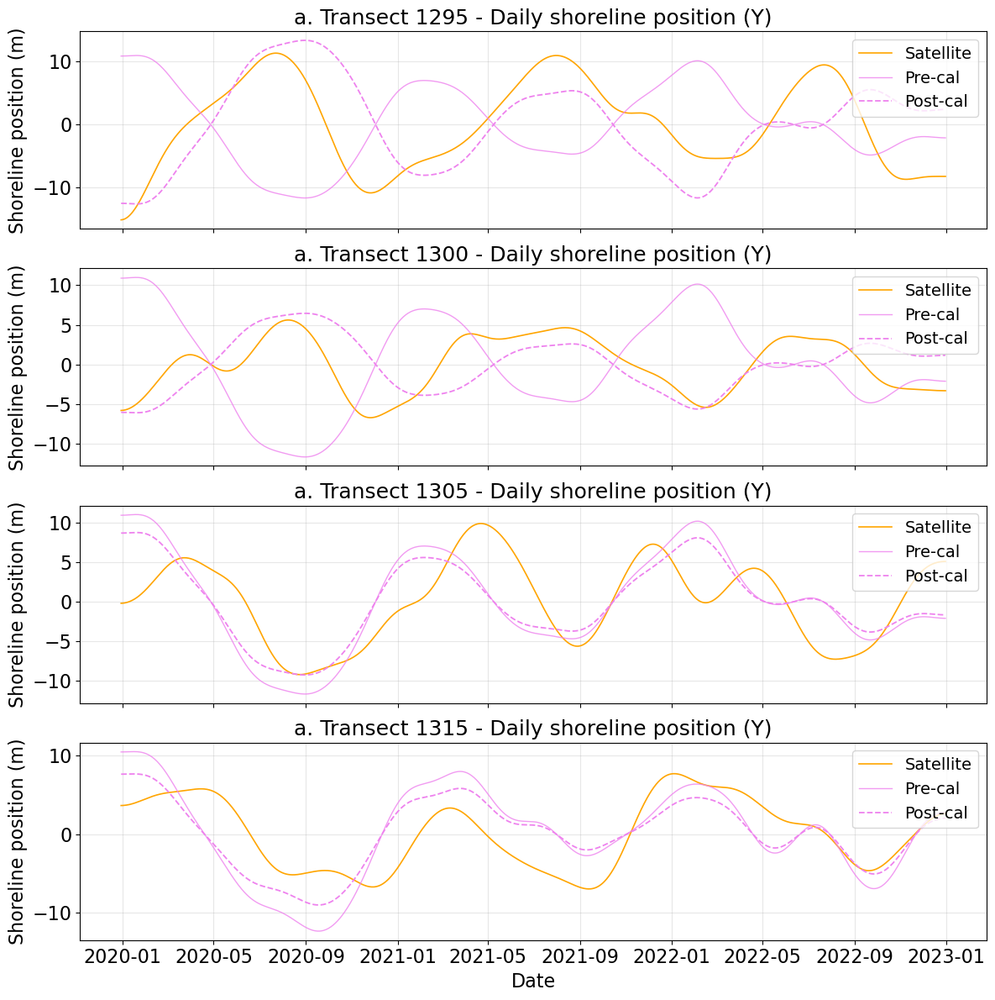

In [89]:
multi_transect_figure([0, 5, 10, 20], c_default=0.1, sigma_plot=30.0)

In [91]:
Xsat_np = np.column_stack([Xsat_store[j] for j in transects_to_plot])

print(Xsat_np.shape)   # (ntime, n_selected_transects)
print(num_transects)

(1098, 51)
51


## Main GLOBCOAST

In [92]:
zone_length = num_transects
dt = 1  # pas de temps journalier

# --- a. INITIALISATION DES TABLEAUX DE RÉSULTATS ---
shape = (Ndays, zone_length)
dKAMP            = np.zeros(shape)
dTWL             = np.zeros(shape)
Ls               = np.zeros(shape)
alpha            = np.zeros(shape)
normal           = np.zeros(shape)
incidence_angle  = np.zeros(shape)

dx_CS_Hydro      = np.zeros(shape)
dx_CS_MorphoLST  = np.zeros(shape)
dx_CS_MorphoTOT  = np.zeros(shape)
dx_CS_MorphoXshore = np.zeros(shape)
dx_CS_TOTAL      = np.zeros(shape)
X_CS_TOTAL       = np.zeros(shape)

x     = np.zeros(shape)
y     = np.zeros(shape)
Lon_m = np.zeros(shape)
Lat_m = np.zeros(shape)

DLon  = np.zeros(shape)
DLat  = np.zeros(shape)
dLon  = np.zeros(shape)
dLat  = np.zeros(shape)

kamp       = np.zeros(shape)
dx_seg_0   = np.zeros(shape)
dy_seg_0   = np.zeros(shape)
dir_wave_to = np.zeros(shape)

# --- b. ÉTAT INITIAL ---
x[0, :] = x_on[1295:1346]
y[0, :] = y_on[1295:1346]

X_CS_TOTAL[0, :] = Xsat_np[0,:]

# Segments initiaux (commencer à j=1)
for j in range(1, zone_length):
    dx_seg_0[0, j] = x[0, j] - x[0, j - 1]
    dy_seg_0[0, j] = y[0, j] - y[0, j - 1]

# Azimut initial (0° Nord, sens horaire)
alpha[0, :] = np.degrees(np.arctan2(dx_seg_0[0, :], dy_seg_0[0, :])) % 360
Ls[0, :]    = np.hypot(dx_seg_0[0, :], dy_seg_0[0, :])

# Direction des vagues et normale orientée
dir_wave_to[0, :] = Dir_full[0, :]  # déjà "to"

normal[0, :] = ((FUNC.compute_oriented_normal(alpha[0, :], dir_wave_to[0, :]) + 180) % 360) - 180

incidence_angle[0, :] = ((dir_wave_to[0, :] - normal[0, :] + 180) % 360) - 180

# --- c. BOUCLE TEMPORELLE ---
for t in range(1, Ndays):

    dir_wave_to[t, :] = Dir_full[t, :]
    incidence_angle[t, :] = ((dir_wave_to[t, :] - normal[0, :] + 180) % 360) - 180

    dTWL = SLR[t] - SLR[t - 1]
    dx_CS_Hydro[t, :] = -dTWL / (c_opt_array[:] * np.tan(slope[:]))
    
    dx_CS_MorphoXshore[t,:] = (1 /(c_opt_array[:] * np.tan(beta[t,:]))) - (1 / (c_opt_array[:] * np.tan(beta[t - 1, :]))) * dt 

    for i in range(1, zone_length - 1):
        angle_i = incidence_angle[t, i]
        angle_ip1 = incidence_angle[t, i + 1]

        # --- 1. Transport Kamphuis (i et i+1) ---
        KAMP_mass_i = 2.33 * (rohs / (rohs - roh)) * (Tp_full[t, i] ** 1.5) * \
                      ( np.tan(slope[i]) ** 0.75) * (d50 ** -0.25) * (Hs_full[t, i] ** 2) * \
                      (abs(np.sin(2 * np.deg2rad(angle_i))) ** 0.6) * np.sign(np.deg2rad(angle_i))

        KAMP_mass_ip1 = 2.33 * (rohs / (rohs - roh)) * (Tp_full[t, i + 1] ** 1.5) * \
                        ( np.tan(slope[i + 1]) ** 0.75) * (d50 ** -0.25) * (Hs_full[t, i + 1] ** 2) * \
                        (abs(np.sin(2 * np.deg2rad(angle_ip1))) ** 0.6) * np.sign(np.deg2rad(angle_ip1))

        KAMP_i = 86400 * (KAMP_mass_i / (rohs - roh)) / (1.0 - poro)
        KAMP_ip1 = 86400 * (KAMP_mass_ip1 / (rohs - roh)) / (1.0 - poro)

        kamp[t, i] = KAMP_i

        # --- 2. Gradient de transport → déplacement du trait de côte ---
        DKAMP = KAMP_ip1 - KAMP_i
        dKAMP[t, i] = DKAMP

        dx_CS_MorphoLST[t, i] = (-1 / DoC) * (DKAMP / Ls[0, i]) * dt
        dx_CS_MorphoTOT[t, i] = dx_CS_MorphoLST[t, i]

    # --- 3. Dernier transect (conditions de bord) ---
    dKAMP[t, -1]           = dKAMP[t, -2]
    dx_CS_MorphoLST[t, -1] = (-1 / DoC) * (dKAMP[t, -1] / Ls[0, -1]) * dt
    dx_CS_Hydro[t, -1] = -dTWL / (c_opt_array[-1] * np.tan(slope[-1]))

    dx_CS_TOTAL[t, :]     = dx_CS_Hydro[t, :] + dx_CS_MorphoLST[t, :] + dx_CS_MorphoXshore[t,:]

    # --- 4. Cumul du changement ---
    X_CS_TOTAL[t, :] = X_CS_TOTAL[t, :] + dx_CS_TOTAL[t, :]

    # --- 5. Mise à jour des coordonnées (optionnel) ---
#     Lon[t, :], Lat[t, :] = move_points(Lat[t - 1, :], Lon[t - 1, :], dx_CS_MorphoLST[t, :], normal[0, :])


In [93]:
print(f"Jour {t} — dx max: {np.max(dx_CS_MorphoLST[1:-1, 27]):.2f} m, cumulé: {np.min(X_CS_TOTAL[1:-1, 27]):.2f} m")
print(f"Jour {t} — dx max: {np.max(dx_CS_Hydro[1:-1, 27]):.2f} m, cumulé: {np.min(X_CS_TOTAL[1:-1, 27]):.2f} m")
print(f"Jour {t} — dx max: {np.max(dx_CS_MorphoXshore[1:-1, 27]):.2f} m, cumulé: {np.min(X_CS_TOTAL[1:-1, 27]):.2f} m")

Jour 1097 — dx max: 11.00 m, cumulé: -178.65 m
Jour 1097 — dx max: 0.55 m, cumulé: -178.65 m
Jour 1097 — dx max: 22.09 m, cumulé: -178.65 m


In [94]:
# Convertir degrés -> radians
theta_rad = np.radians(normal[0,1:])

# Calcul des composantes (selon convention trigonométrique)
u = np.sin(theta_rad)   # vers l'Est
v = np.cos(theta_rad)   # vers le Nord


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


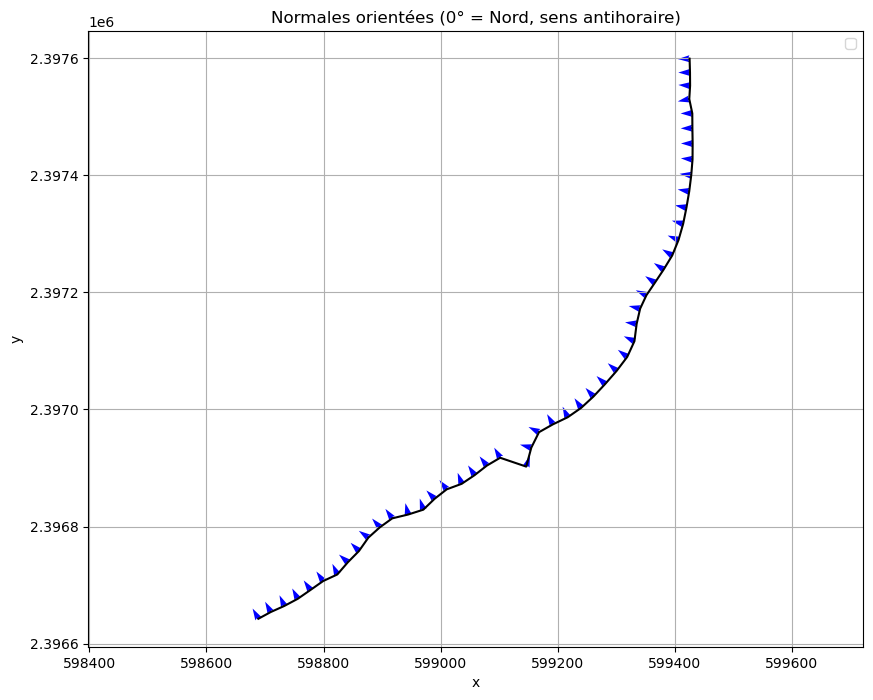

In [95]:
plt.figure(figsize=(10, 8))
plt.quiver(x_on_sub[1:], y_on_sub[1:], u, v, angles='xy', scale_units='xy', scale=0.05, width=0.003, color='blue')

plt.plot(x_on_sub[1:], y_on_sub[1:], 'k-',)  # pour visualiser la ligne de côte
plt.axis('equal')
plt.title("Normales orientées (0° = Nord, sens antihoraire)")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.legend()
plt.show()

In [96]:
# 2. Convert to DataFrame
df_daily = pd.DataFrame(X_CS_TOTAL, index=model_dates)

# 3. Resample to monthly mean
monthly_mean = df_daily.resample('M').mean()

# 4. Smoothing function applied column-wise
def fast_gaussian_smooth_df(df, sigma):
    smoothed_data = np.apply_along_axis(gaussian_filter1d, axis=0, arr=df.values, sigma=sigma)
    return pd.DataFrame(smoothed_data, index=df.index, columns=df.columns)

# 5. Apply smoothing
sigma = 1.0  # ~3-month smoothing

monthly_mean_detrend_GC = fast_gaussian_smooth_df(monthly_mean, sigma)

In [97]:
## We want to compare with CoastSat validation values
print(monthly_mean_detrend_GC)

                   0         1          2          3          4         5   \
2019-12-31 -11.877639 -3.580999   9.382216 -19.687183 -36.909639 -7.238384   
2020-01-31  -5.554093  0.596947  12.059849 -15.500123 -29.616028 -3.986806   
2020-02-29  -0.928933  3.423798  13.101950 -11.605541 -23.333407 -1.534998   
2020-03-31   0.287798  3.142564   9.928119  -7.677098 -15.718862 -0.600365   
2020-04-30   0.314496  2.150836   6.485637  -4.847115  -9.959760 -0.351269   
2020-05-31   0.400012  1.499064   4.268205  -2.991052  -6.121934 -0.140164   
2020-06-30   0.332615  0.817503   2.291726  -1.474115  -2.707505  0.022736   
2020-07-31   0.167894  0.322521   0.931288  -0.555818  -0.742862  0.059704   
2020-08-31   0.126600  0.299432   0.937915  -0.621520  -0.683414  0.047787   
2020-09-30  -0.053032  0.632519   2.510908  -2.133777  -2.854590 -0.130444   
2020-10-31  -0.310578  1.295063   5.180186  -4.624563  -7.227737 -0.455284   
2020-11-30  -0.391117  2.481177   8.620843  -7.522320 -14.319021

In [100]:
Xsat_val
Xsat_np

array([[-15.12443197, -11.84292256,  -7.64609872, ...,  -8.9627576 ,
         -9.77243233, -10.33698888],
       [-15.11405158, -11.83513121,  -7.64128832, ...,  -8.95437251,
         -9.76281078, -10.32985171],
       [-15.09331178, -11.81956415,  -7.63167538, ...,  -8.93761757,
         -9.74358281, -10.31558227],
       ...,
       [ -8.22263573,  -9.32901479,  -5.66394624, ...,  -3.57703038,
         -4.71123737,  -5.07220115],
       [ -8.2228098 ,  -9.33267716,  -5.66402504, ...,  -3.57791841,
         -4.71106646,  -5.07581012],
       [ -8.22287547,  -9.33450383,  -5.66406192, ...,  -3.57835639,
         -4.71096083,  -5.07760162]])

In [114]:
val_daily = pd.DataFrame(Xsat_np, index=model_dates)
val_monthly_mean = val_daily.resample('M').mean()
print(val_monthly_mean)


# val_monthly_mean_smooth = fast_gaussian_smooth_df(val_monthly_mean, sigma)

val_monthly_mean2 = val_monthly_mean.loc["2020":"2022"]
monthly_mean_detrend_GC = monthly_mean_detrend_GC.loc["2020":"2022"]

# # --- 2. Make BOTH anomalies by removing their own mean ---
# val_monthly_anom = val_monthly_mean2 - val_monthly_mean2.mean()
# gc_monthly_anom  = monthly_mean_detrend_GC - monthly_mean_detrend_GC.mean()

                   0          1         2         3         4         5   \
2019-12-31 -15.119242 -11.839027 -7.643694 -5.856454 -5.726677 -5.789718   
2020-01-31 -13.321904 -10.490564 -6.795408 -5.354633 -5.111667 -5.094795   
2020-02-29  -6.947766  -5.789492 -3.545695 -3.087996 -2.236918 -2.284683   
2020-03-31  -1.355801  -2.183261 -0.141717 -0.557343  0.662602  0.602311   
2020-04-30   2.004902  -0.292375  1.551545  0.227023  0.406518  0.668093   
2020-05-31   4.781179   2.041251  1.744112  0.773292  0.321153 -0.635576   
2020-06-30   8.249034   4.742337  2.990353  2.394653  2.466308  1.014501   
2020-07-31  11.013558   7.689758  6.034728  4.798779  4.874353  4.362832   
2020-08-31   9.530408   8.448950  6.951339  5.353743  5.327648  5.324701   
2020-09-30   3.316653   4.597911  2.968661  1.774072  2.254348  2.622272   
2020-10-31  -5.046000  -2.378475 -3.288194 -3.820978 -3.100932 -2.530280   
2020-11-30 -10.216198  -7.272157 -7.391822 -6.550634 -6.431490 -6.253882   
2020-12-31  

In [115]:
print(val_monthly_mean)
print(monthly_mean_detrend_GC)

                   0          1         2         3         4         5   \
2019-12-31 -15.119242 -11.839027 -7.643694 -5.856454 -5.726677 -5.789718   
2020-01-31 -13.321904 -10.490564 -6.795408 -5.354633 -5.111667 -5.094795   
2020-02-29  -6.947766  -5.789492 -3.545695 -3.087996 -2.236918 -2.284683   
2020-03-31  -1.355801  -2.183261 -0.141717 -0.557343  0.662602  0.602311   
2020-04-30   2.004902  -0.292375  1.551545  0.227023  0.406518  0.668093   
2020-05-31   4.781179   2.041251  1.744112  0.773292  0.321153 -0.635576   
2020-06-30   8.249034   4.742337  2.990353  2.394653  2.466308  1.014501   
2020-07-31  11.013558   7.689758  6.034728  4.798779  4.874353  4.362832   
2020-08-31   9.530408   8.448950  6.951339  5.353743  5.327648  5.324701   
2020-09-30   3.316653   4.597911  2.968661  1.774072  2.254348  2.622272   
2020-10-31  -5.046000  -2.378475 -3.288194 -3.820978 -3.100932 -2.530280   
2020-11-30 -10.216198  -7.272157 -7.391822 -6.550634 -6.431490 -6.253882   
2020-12-31  

In [116]:
common_index = val_monthly_mean2.index.intersection(monthly_mean_detrend_GC.index)
val_monthly_mean = val_monthly_mean2.loc[common_index]
monthly_mean_detrend_GC = monthly_mean_detrend_GC.loc[common_index]

In [117]:
# Now I can compute and plot the metrics in a 2 x 2 panel along x_on_sub and y_on_sub

def calculate_metrics(Yobs, Ymod):
    Yobs = np.array(Yobs)
    Ymod = np.array(Ymod)

    # RMSE
    rmse = np.sqrt(np.mean((Ymod - Yobs) ** 2))

    # Willmott's Index of Agreement
    Yobs_mean = np.mean(Yobs)
    numerator = np.sum((Ymod - Yobs) ** 2)
    denominator = np.sum(
        (np.abs(Ymod - Yobs_mean) + np.abs(Yobs - Yobs_mean)) ** 2
    )
    d_index = 1 - (numerator / denominator)

    # Percentage within ±10 m uncertainty
    within_bounds = np.abs(Ymod - Yobs) <= 10
    percent_within_ci = 100 * np.sum(within_bounds) / len(Yobs)

    # Pearson correlation
    corr = np.corrcoef(Yobs, Ymod)[0, 1]

    return rmse, d_index, percent_within_ci, corr


In [125]:
n_transects = val_monthly_mean.shape[1]

rmse_all = np.zeros(n_transects)
d_all    = np.zeros(n_transects)
pct_all  = np.zeros(n_transects)
corr_all = np.zeros(n_transects)

for j in range(n_transects):
    # ✅ correct way to get column j from a DataFrame
    Yobs = val_monthly_mean.iloc[:, j].to_numpy()
    Ymod = monthly_mean_detrend_GC.iloc[:, j].to_numpy()

    rmse, d_index, pct_ci, corr = calculate_metrics(Yobs, Ymod)

    rmse_all[j] = rmse
    d_all[j]    = d_index
    pct_all[j]  = pct_ci
    corr_all[j] = corr


In [126]:
print(corr_all)

[ 0.47475098 -0.57568144 -0.66761241  0.6537781   0.64480478  0.68384909
 -0.70259231  0.51479513 -0.34226083 -0.02964542  0.25841427  0.50389258
  0.55156595 -0.38257682 -0.3488014   0.40016725  0.65726192 -0.78952142
 -0.79421616  0.80845644  0.43346291 -0.24463969  0.09158804 -0.25119866
 -0.58692542  0.61875862  0.61584966  0.58680635  0.40643032  0.48858351
  0.50186243  0.38319888  0.14665493 -0.16191311 -0.58914759  0.59782967
  0.55795576 -0.15904832 -0.2182546   0.23079234  0.10317425 -0.23137244
 -0.36983497 -0.3983204  -0.4758689   0.30001293 -0.60440206  0.63400567
 -0.46342523 -0.0018089  -0.00471072]


In [127]:
def extract_cosmos_transect(f, idx):
    """
    Extrait les données temporelles de shoreline, Y0 et les dates
    pour un transect donné (par son index) depuis un fichier CoSMoS .mat.

    Paramètres :
        f   : fichier HDF5 ouvert avec h5py
        idx : index entier du transect (ex: 1322)

    Retourne :
        dates : liste de datetime.datetime
        Y     : ndarray 1D de la position du rivage
        Y0    : float, position initiale
    """
    group = f['transects']
    
    # Récupération des références
    ref_Y = group['Y'][0, idx]
    ref_Y0 = group['Y0'][0, idx]
    ref_t = group['t'][0, idx]

    # Extraction des données
    Y = np.array(f[ref_Y][()]).flatten()
    Y0 = float(f[ref_Y0][()][0])
    t = np.array(f[ref_t][()]).flatten()

    # Conversion des dates MATLAB → datetime Python
    dates = [
        datetime.fromordinal(int(d)) + timedelta(days=d % 1) - timedelta(days=366)
        for d in t
    ]

    return dates, Y, Y0

from datetime import datetime, timedelta
import h5py
import numpy as np

transects = {}

with h5py.File(INPUT + 'CoSMoS_COAST_results_02-Feb-2150_SL=223cm_transects.mat', 'r') as f:

    for idx in range(1295, 1347):   # 1295–1346 inclus
        dates, Y, Y0 = extract_cosmos_transect(f, idx)

        transects[idx] = {
            "dates": dates,
            "Y": Y,
            "Y0": Y0
        }

        print(f"✔️ Transect {idx} | {len(dates)} points | Y0 = {Y0:.2f}")

def get_Y_at_year(dates, Y, year):
    dt_index = pd.to_datetime(dates)
    target = datetime(year, 7, 1)
    idx = (np.abs(dt_index - target)).argmin()
    return Y[idx]

target_ids = list(range(1295, 1345))   # 50 transects
tid_to_i = {tid: tid - 1295 for tid in target_ids}

print(len(target_ids), len(x_on_web))  # DOIT afficher: 50 50

✔️ Transect 1295 | 839 points | Y0 = 71.69
✔️ Transect 1296 | 847 points | Y0 = 67.72
✔️ Transect 1297 | 871 points | Y0 = 65.41
✔️ Transect 1298 | 877 points | Y0 = 64.57
✔️ Transect 1299 | 892 points | Y0 = 63.88
✔️ Transect 1300 | 908 points | Y0 = 63.38
✔️ Transect 1301 | 919 points | Y0 = 61.79
✔️ Transect 1302 | 909 points | Y0 = 65.30
✔️ Transect 1303 | 928 points | Y0 = 57.48
✔️ Transect 1304 | 925 points | Y0 = 49.15
✔️ Transect 1305 | 924 points | Y0 = 42.94
✔️ Transect 1306 | 934 points | Y0 = 40.33
✔️ Transect 1307 | 940 points | Y0 = 40.55
✔️ Transect 1308 | 949 points | Y0 = 48.06
✔️ Transect 1309 | 939 points | Y0 = 52.11
✔️ Transect 1310 | 937 points | Y0 = 51.42
✔️ Transect 1311 | 932 points | Y0 = 50.99
✔️ Transect 1312 | 931 points | Y0 = 55.64
✔️ Transect 1313 | 942 points | Y0 = 55.50
✔️ Transect 1314 | 959 points | Y0 = 59.02
✔️ Transect 1315 | 961 points | Y0 = 61.90
✔️ Transect 1316 | 957 points | Y0 = 100.56
✔️ Transect 1317 | 968 points | Y0 = 79.03
✔️ Transec

In [128]:
years = [2020, 2023]

shorelines_cc = {
    "baseline": {"x": [], "y": []},   # Y0
    2020: {"x": [], "y": []},
    2023: {"x": [], "y": []}
}

for tid in target_ids:

    i = tid_to_i[tid]

    angle_rad = np.deg2rad(angle[i])
    x0 = x_on_web[i]
    y0 = y_on_web[i]

    dates = transects[tid]["dates"]
    Y     = np.array(transects[tid]["Y"])
    Y0    = transects[tid]["Y0"]

    # --- baseline Y0 ---
    x_ref = x0 + Y0 * np.cos(angle_rad)
    y_ref = y0 + Y0 * np.sin(angle_rad)

    shorelines_cc["baseline"]["x"].append(x_ref)
    shorelines_cc["baseline"]["y"].append(y_ref)

    # --- 2020 & 2023 ---
    for yr in years:
        Yt = get_Y_at_year(dates, Y, yr)
        dY = Yt - Y0

        x_t = x_ref  * np.cos(angle_rad)
        y_t = y_ref * np.sin(angle_rad)

        shorelines_cc[yr]["x"].append(x_t)
        shorelines_cc[yr]["y"].append(y_t)

In [129]:
# ==============================
# 0. PARAMÈTRES ET HILPER FONCTIONS
# ==============================

# Année de référence commune (baseline temporelle)
ref_year = 2020

# Années qu’on veut voir sur la carte
years = [2020, 2022]

# target_ids : liste de transects CoSMoS correspondants à GC
# ex : target_ids = list(range(1295, 1346))
# tid_to_i : {tid -> index 0..(n_transects-1)}
# ex : tid_to_i = {tid: i for i, tid in enumerate(target_ids)}

n_transects = len(target_ids)

def get_cc_at_year(dates, Y, year):
    """
    CoSMoS : retourne la valeur Y à la date la plus proche du 1er juillet de l'année `year`.
    """
    dt_index = pd.to_datetime(dates)
    target = datetime(year, 7, 1)
    idx = (np.abs(dt_index - target)).argmin()
    return Y[idx]

def get_gc_at_year(df_monthly, year):
    """
    GlobCoast : retourne le vecteur [n_transects] X_CS_TOTAL (lissé)
    à la date mensuelle la plus proche du 1er juillet de l'année `year`.
    """
    target = datetime(year, 7, 1)
    idx = (np.abs(df_monthly.index - target)).argmin()
    # on suppose que les colonnes sont dans le même ordre que les transects (0..n_transects-1)
    return df_monthly.iloc[idx, :].values  # shape (n_transects,)

# ==============================
# 1. SHORELINES GC (GlobCoast)
# ==============================

# Baseline géométrique commune : x_on_web / y_on_web (une valeur par transect)
# On extrait juste les points qui correspondent à target_ids via tid_to_i

baseline_x = np.zeros(n_transects)
baseline_y = np.zeros(n_transects)

for tid in target_ids:
    i = tid_to_i[tid]      # index (0..n_transects-1) dans GC, x_on_web, angle
    baseline_x[i] = x_on_web[i]
    baseline_y[i] = y_on_web[i]

shorelines_gc = {
    "baseline": {"x": baseline_x.copy(), "y": baseline_y.copy()},
}

# --- GC : anomalies par rapport à ref_year (2020) ---
X_gc_ref = get_gc_at_year(monthly_mean_detrend_GC, ref_year)

for yr in years:
    X_gc_yr = get_gc_at_year(monthly_mean_detrend_GC, yr)
    dX_gc   = X_gc_yr - X_gc_ref  # anomalie (m) le long du profil

    xs = np.zeros(n_transects)
    ys = np.zeros(n_transects)

    for tid in target_ids:
        i = tid_to_i[tid]
        angle_rad = np.deg2rad(angle[i])

        x0 = baseline_x[i]
        y0 = baseline_y[i]

        dx = dX_gc[i] * np.cos(angle_rad)
        dy = dX_gc[i] * np.sin(angle_rad)

        xs[i] = x0 + dx
        ys[i] = y0 + dy

    shorelines_gc[yr] = {"x": xs, "y": ys}

# ==============================
# 2. SHORELINES CoSMoS-COAST (CC)
# ==============================

shorelines_cc = {yr: {"x": np.zeros(n_transects), "y": np.zeros(n_transects)} for yr in years}

# Pré-calcul Y_ref_cc (valeur CC en 2020) pour chaque transect
Y_ref_cc = {}

for tid in target_ids:
    dates = transects[tid]["dates"]
    Y     = np.array(transects[tid]["Y"])
    Y_ref_cc[tid] = get_cc_at_year(dates, Y, ref_year)

# Construction des shoreline CC en anomalies par rapport à 2020,
# projetées autour de la MÊME baseline que GC (baseline_x, baseline_y)
for yr in years:
    for tid in target_ids:
        i = tid_to_i[tid]

        dates = transects[tid]["dates"]
        Y     = np.array(transects[tid]["Y"])

        Y_yr = get_cc_at_year(dates, Y, yr)
        dY   = Y_yr - Y_ref_cc[tid]  # anomalie (m) le long du profil

        angle_rad = np.deg2rad(angle[i])

        x0 = baseline_x[i]
        y0 = baseline_y[i]

        dx = dY * np.cos(angle_rad)
        dy = dY * np.sin(angle_rad)

        shorelines_cc[yr]["x"][i] = x0
        shorelines_cc[yr]["y"][i] = y0

# ==============================
# 3. PLOT SUR FOND DE CARTE
# ==============================


In [130]:
from matplotlib.colors import TwoSlopeNorm

rmse_sub = rmse_all[:-1]
d_sub    = d_all[:-1]
pct_sub  = pct_all[:-1]
corr_sub = corr_all[:-1]

print(corr_sub.shape)

(50,)


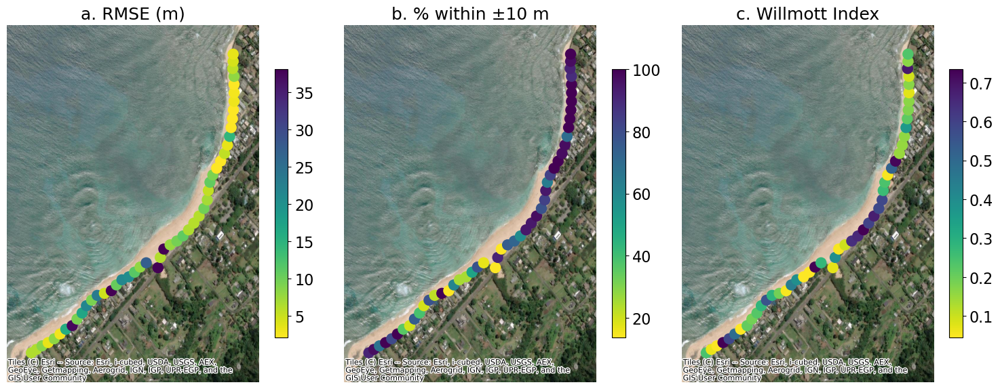

In [133]:
import numpy as np
import matplotlib.pyplot as plt
import contextily as cx
from cmcrameri import cm
from matplotlib.colors import TwoSlopeNorm  # not used, but keep if you extend later

# ---------- Common map extent from 2020 shoreline ----------
x_2020 = shorelines_cc[2020]["x"]
y_2020 = shorelines_cc[2020]["y"]

xmin, xmax = np.nanmin(x_2020), np.nanmax(x_2020)
ymin, ymax = np.nanmin(y_2020), np.nanmax(y_2020)
pad = 100
xlim = (xmin - pad, xmax + pad)
ylim = (ymin - pad, ymax + pad)

# ---------- Metrics & plot settings ----------
metrics = [rmse_sub, pct_sub, d_sub]
titles  = ["RMSE (m)", "% within ±10 m", "Willmott Index"]
letters = ["a.", "b.", "c."]

# use cmcrameri or matplotlib colormaps as you like
cmaps   = ["viridis_r", "viridis_r", "viridis_r"]

fig, axes = plt.subplots(1, 3, figsize=(15, 6))
axes = axes.ravel()

for ax, data, title, letter, cmap in zip(axes, metrics, titles, letters, cmaps):
    valid = data[np.isfinite(data)]

    # ----- value range from percentiles -----
    if valid.size > 0:
        vmin = np.percentile(valid, 5)
        vmax = np.percentile(valid, 95)
    else:
        vmin, vmax = np.nanmin(data), np.nanmax(data)

 #   ----- fix extent BEFORE basemap -----
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    # basemap
    cx.add_basemap(
        ax,
        crs="EPSG:3857",
        source=cx.providers.Esri.WorldImagery,
        zorder=0,
    )

    # scatter of metrics (smoothed with Wfilter)
    sc = ax.scatter(
        x_2020,
        y_2020,
        c=FUNC.Wfilter(data,x_2020, y_2020, 4),
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        s=140,
        edgecolor="none",
        linewidth=0.4,
        zorder=2,
    )

    ax.set_title(f"{letter} {title}", fontsize=18, loc="center")
    ax.set_axis_off()

    cbar = plt.colorbar(sc, ax=ax, shrink=0.75)
    cbar.ax.tick_params(labelsize=16)

plt.tight_layout()
plt.show()


In [134]:
def extract_cosmos_transect(f, idx):
    """
    Extrait les données temporelles de shoreline, Y0 et les dates
    pour un transect donné (par son index) depuis un fichier CoSMoS .mat.

    Paramètres :
        f   : fichier HDF5 ouvert avec h5py
        idx : index entier du transect (ex: 1322)

    Retourne :
        dates : liste de datetime.datetime
        Y     : ndarray 1D de la position du rivage
        Y0    : float, position initiale
    """
    group = f['transects']
    
    # Récupération des références
    ref_Y = group['Y'][0, idx]
    ref_Y0 = group['Y0'][0, idx]
    ref_t = group['t'][0, idx]

    # Extraction des données
    Y = np.array(f[ref_Y][()]).flatten()
    Y0 = float(f[ref_Y0][()][0])
    t = np.array(f[ref_t][()]).flatten()

    # Conversion des dates MATLAB → datetime Python
    dates = [
        datetime.fromordinal(int(d)) + timedelta(days=d % 1) - timedelta(days=366)
        for d in t
    ]

    return dates, Y, Y0

## FOCUS ON 1323

In [135]:
from datetime import datetime, timedelta

with h5py.File(INPUT + 'CoSMoS_COAST_results_02-Feb-2150_SL=223cm_transects.mat', 'r') as f:
    idx = 1323  # par exemple
    dates, Y, Y0 = extract_cosmos_transect(f, idx)

    print(f"✔️ Transect {idx}")
    print(f"Y0 = {Y0}")
    print(f"{len(dates)} dates : {dates[:3]} ...")
    print(f"Y = {Y[:3]} ...")

✔️ Transect 1323
Y0 = 68.19108999979267
968 dates : [datetime.datetime(1928, 1, 1, 0, 0), datetime.datetime(1932, 1, 1, 0, 0), datetime.datetime(1949, 1, 1, 0, 0)] ...
Y = [75.70638251 63.83671248 56.03802952] ...


In [136]:
df = pd.DataFrame({'Y': Y}, index=pd.to_datetime(dates))
df_filtered = df.loc['2019-12-31' : '2023-01-01']
print(df_filtered)
monthly_mean_CC = df_filtered.resample('M').mean()
monthly_mean_detrend_CC = fast_gaussian_smooth_df(monthly_mean_CC, sigma)

                                    Y
2020-01-07 19:33:44.999997  38.503124
2020-01-07 20:46:29.999998  36.257257
2020-01-07 20:46:31.000003  36.978164
2020-01-09 21:19:00.000002  28.526189
2020-01-22 19:28:57.000000  31.518454
...                               ...
2022-12-20 20:05:36.939998  40.481161
2022-12-21 20:04:07.889999  35.542910
2022-12-25 20:44:49.959995  44.309617
2022-12-25 20:54:00.000001  26.222862
2022-12-29 21:19:00.000002  30.218667

[470 rows x 1 columns]


In [137]:
print(X_CS_TOTAL.shape)

(1098, 51)


In [138]:
target_ids = [1323]
target_ids_GC = [27]

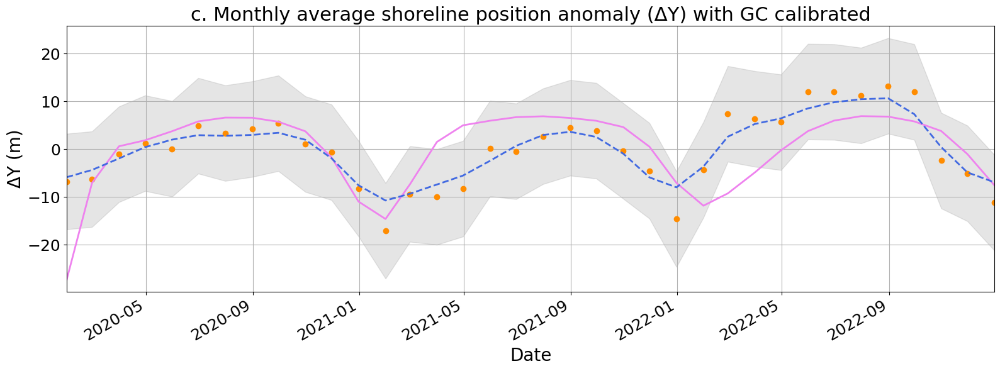

In [139]:
from datetime import datetime, timedelta

# 1. Plage de dates journalières du modèle GC
date_range = [datetime(2019, 12, 31) + timedelta(days=i) for i in range(X_CS_TOTAL.shape[0])]

# 2. Figure multi-transect
fig, axs = plt.subplots(len(target_ids), 1, figsize=(16, 6 * len(target_ids)), sharex=True)
if len(target_ids) == 1:
    axs = [axs]

start_date = datetime(2020, 1, 31)
end_date = datetime(2022, 12, 31)

for i, (tid, gc_idx) in enumerate(zip(target_ids, target_ids_GC)):
    ax = axs[i]

    # === 1. Satellite: moyenne mensuelle sans recentrage
    if tid in transect_data:
        sat_dates, sat_Y, Y0 = transect_data[tid]

        df_sat = pd.DataFrame({'Y': sat_Y}, index=pd.to_datetime(sat_dates))
        df_sat_monthly = df_sat.resample('M').mean()

        # Anomalie satellite (centrée sur sa moyenne)
        sat_anom = df_sat_monthly['Y'] - df_sat_monthly['Y'].mean()

        # Tracé des points satellites
        ax.plot(
            df_sat_monthly.index,
            sat_anom,
            'o',
            color='darkorange',
            label='CoastSat SDS',
            linewidth=2
        )

        # Bande d'incertitude ± 10 m autour de la mesure satellite
        # (i.e. autour de sat_anom)
        if i == 0:
            # On ne met le label qu’une seule fois (subplot du haut)
            ax.fill_between(
                df_sat_monthly.index,
                sat_anom - 10,
                sat_anom + 10,
                color='gray',
                alpha=0.2,
                label='±10 m uncertainty'
            )
        else:
            ax.fill_between(
                df_sat_monthly.index,
                sat_anom - 10,
                sat_anom + 10,
                color='gray',
                alpha=0.2
            )

    else:
        print(f"⚠️ Transect {tid} non trouvé dans transect_data")
        continue

    # === 2. GC Model: smooth, centered to CoastSat mean (déjà centré dans monthly_mean_detrend)
    try:
        model_gc = monthly_mean_detrend_GC.iloc[:, gc_idx]
        model_gc_series = model_gc
        ax.plot(
            model_gc_series.index,
            model_gc_series.values,
            '-',
            label='GC Model',
            color='violet',
            linewidth=2
        )
    except Exception as e:
        print(f"⚠️ Erreur sur GC Model transect {gc_idx} : {e}")

    # === 3. CoSMoS model : moyenne mensuelle (déjà préparée)
    try:
        ax.plot(
            monthly_mean_detrend_CC.index,
            monthly_mean_detrend_CC['Y'] - monthly_mean_detrend_CC['Y'].mean(),
            '--',
            color='royalblue',
            label='Moskvichev et al., 2025',
            linewidth=2
        )
    except Exception as e:
        print(f"⚠️ Erreur CoSMoS transect {tid} : {e}")

    # Mise en forme
    ax.set_xlim([start_date, end_date])
    ax.set_ylabel("ΔY (m)", fontsize=20)
    ax.set_title(
        "c. Monthly average shoreline position anomaly (ΔY) with GC calibrated",
        loc='center',
        fontsize=22
    )
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax.grid(True)
#     ax.legend(
#         loc='lower left',
#         fontsize=18,
#         frameon=True,
#     )

# Label x-axis
axs[-1].set_xlabel("Date", fontsize=20)
fig.autofmt_xdate()
plt.tight_layout()
plt.show()


In [158]:
model = model_gc 
sat   = df_sat_monthly['Y']
CC    =  monthly_mean_detrend_CC['Y'] 

In [159]:
print(sat.shape)
print(model)

(36,)
2020-01-31   -27.292163
2020-02-29    -7.097964
2020-03-31     0.587085
2020-04-30     1.845069
2020-05-31     3.741017
2020-06-30     5.793825
2020-07-31     6.585895
2020-08-31     6.558008
2020-09-30     5.721053
2020-10-31     3.720956
2020-11-30    -1.725716
2020-12-31   -10.976728
2021-01-31   -14.618682
2021-02-28    -7.375137
2021-03-31     1.494104
2021-04-30     4.977339
2021-05-31     5.932753
2021-06-30     6.677932
2021-07-31     6.862791
2021-08-31     6.510480
2021-09-30     5.920668
2021-10-31     4.602123
2021-11-30     0.506156
2021-12-31    -7.067925
2022-01-31   -11.846633
2022-02-28    -9.268306
2022-03-31    -4.894857
2022-04-30    -0.267952
2022-05-31     3.758297
2022-06-30     5.960744
2022-07-31     6.891513
2022-08-31     6.796341
2022-09-30     5.793233
2022-10-31     3.782729
2022-11-30    -1.033940
2022-12-31    -7.554109
Freq: M, Name: 27, dtype: float64


In [160]:
results = calculate_metrics(sat, model)
print(results)

results_model = calculate_metrics(CC, model)
print(results_model)

results_rich = calculate_metrics(sat,CC)
print(results_rich)

(47.0632591237184, 0.23053995009866501, 0.0, 0.585477414035936)
(44.948170188466854, 0.198285643296077, 0.0, 0.6086911499255759)
(3.239084336056404, 0.9419556663362543, 100.0, 0.967548460282569)


In [165]:
import numpy as np
import pandas as pd
from scipy.signal import butter, filtfilt
import matplotlib.pyplot as plt

# ---------------------------------------------------------------------
# 1. Align and build anomalies
# ---------------------------------------------------------------------
# Put everything in one DataFrame and drop any rows with missing values
df = pd.concat(
    {
        "obs": sat,
        "gc": model,
        "cc": CC
    },
    axis=1
).dropna()

# Anomalies (remove mean)
df_anom = df #- df.mean()

# Sampling frequency: 1 point per month
fs = 1.0          # cycles per month
nyq = 0.5 * fs    # Nyquist frequency


# ---------------------------------------------------------------------
# 2. Butterworth filter
# ---------------------------------------------------------------------
def butter_filter(series, f_low=None, f_high=None, order=4):
    """
    Apply a Butterworth filter to a pandas Series with monthly sampling.
    f_low, f_high are in cycles per month.
    """
    if f_low is not None and f_high is not None:
        Wn = [f_low / nyq, f_high / nyq]
        btype = "bandpass"
    elif f_low is not None:
        Wn = f_low / nyq
        btype = "highpass"
    elif f_high is not None:
        Wn = f_high / nyq
        btype = "lowpass"
    else:
        raise ValueError("Specify f_low and/or f_high")

    b, a = butter(order, Wn, btype=btype)
    filtered = filtfilt(b, a, series.values)
    return pd.Series(filtered, index=series.index, name=series.name)


# ---------------------------------------------------------------------
# 3. Timescale cutoffs (in months)
# ---------------------------------------------------------------------
# You can tweak these, but this is a reasonable starting point:
P_HF_MAX   = 4.0   # high-frequency: periods < 4 months
P_SEA_MIN  = 4.0
P_SEA_MAX  = 18.0  # seasonal: 4–18 months
P_INT_MIN  = 18.0  # interannual: periods > 18 months

# Convert to frequencies [cycles per month]
f_hf_low      = 1.0 / P_HF_MAX      # high-pass cutoff
f_season_low  = 1.0 / P_SEA_MAX     # bandpass low cutoff
f_season_high = 1.0 / P_SEA_MIN     # bandpass high cutoff
f_inter_high  = 1.0 / P_INT_MIN     # low-pass cutoff


# ---------------------------------------------------------------------
# 4. Decompose a series into HF / seasonal / interannual
# ---------------------------------------------------------------------
def decompose_timescales(series_anom):
    """
    Decompose a monthly anomaly series into:
    - highfreq   (< 4 months)
    - seasonal   (4–18 months)
    - interannual(> 18 months)
    Returns a dict of pandas Series.
    """
    interannual = butter_filter(series_anom, f_high=f_inter_high)
    highfreq    = butter_filter(series_anom, f_low=f_hf_low)
    seasonal    = series_anom - interannual - highfreq

    return {
        "highfreq":   highfreq,
        "seasonal":   seasonal,
        "interannual": interannual,
    }


# ---------------------------------------------------------------------
# 5. Apply to obs / GC / CoSMoS
# ---------------------------------------------------------------------
obs_comp = decompose_timescales(df["obs"])
gc_comp  = decompose_timescales(df["gc"])
cc_comp  = decompose_timescales(df["cc"])


# ---------------------------------------------------------------------
# 6. RMSE helper
# ---------------------------------------------------------------------
def rmse(a, b):
    return np.sqrt(((a - b) ** 2).mean())


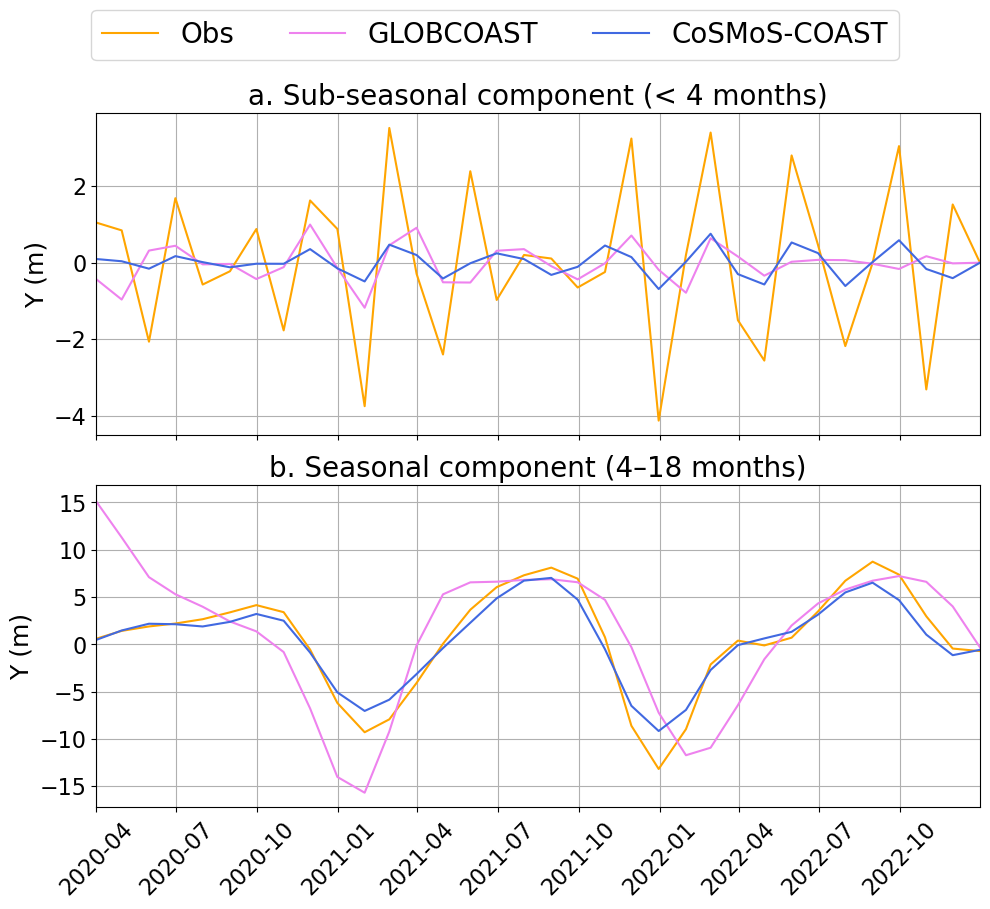

In [172]:
fig, axes = plt.subplots(2, 1, figsize=(10, 9), sharex=True)

# High-frequency
ax = axes[0]
ax.plot(df_anom['obs'].index, obs_comp["highfreq"], color='orange', label="Obs", linewidth=1.5)
ax.plot(df_anom['obs'].index,  gc_comp["highfreq"], color='violet',  label="GLOBCOAST",  linewidth=1.5)
ax.plot(df_anom['obs'].index,  cc_comp["highfreq"], color='royalblue', label="CoSMoS-COAST", linewidth=1.5)
ax.set_ylabel("Y (m)", fontsize=18)
ax.set_title("a. Sub-seasonal component (< 4 months)", fontsize=20)
ax.grid(True)

# Seasonal
ax = axes[1]
ax.plot(df_anom['obs'].index, obs_comp["seasonal"], color='orange',label="Obs", linewidth=1.5)
ax.plot(df_anom['obs'].index,  gc_comp["seasonal"], color='violet',  label="GLOBCOAST", linewidth=1.5)
ax.plot(df_anom['obs'].index,  cc_comp["seasonal"], color='royalblue', label="CoSMoS-COAST" , linewidth=1.5)
ax.set_ylabel("Y (m)", fontsize=18)
ax.set_title("b. Seasonal component (4–18 months)", fontsize=20)
ax.grid(True)

# # Interannual
# ax = axes[2]
# ax.plot(obs_comp["interannual"].index, obs_comp["interannual"], color='orange',label="Obs", linewidth=1.5)
# ax.plot(gc_comp["interannual"].index,  gc_comp["interannual"], color='violet', label="GLOBCOAST", linestyle="--", linewidth=1.5)
# ax.plot(cc_comp["interannual"].index,  cc_comp["interannual"], color='royalblue', label="CoSMoS-COAST", linestyle=":", linewidth=1.5)
# ax.set_ylabel("ΔY (m)",fontsize=18)
# ax.set_title("c. Interannual component (> 18 months)", fontsize=20)
# ax.grid(True)
# ax.set_xlabel("Time",fontsize=18)

# Bigger ticks + 45° rotation on x-axis
for ax in axes:
    ax.tick_params(axis='y', labelsize=16)

axes[1].tick_params(axis='x', labelsize=16, rotation=45)

# Legend only once
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=3, bbox_to_anchor=(0.5, 1.02),fontsize=20)
axes[1].set_xlim(pd.Timestamp("2020-04-01"), df_anom['obs'].index.max())
fig.tight_layout(rect=[0, 0, 1,0.94])
plt.show()


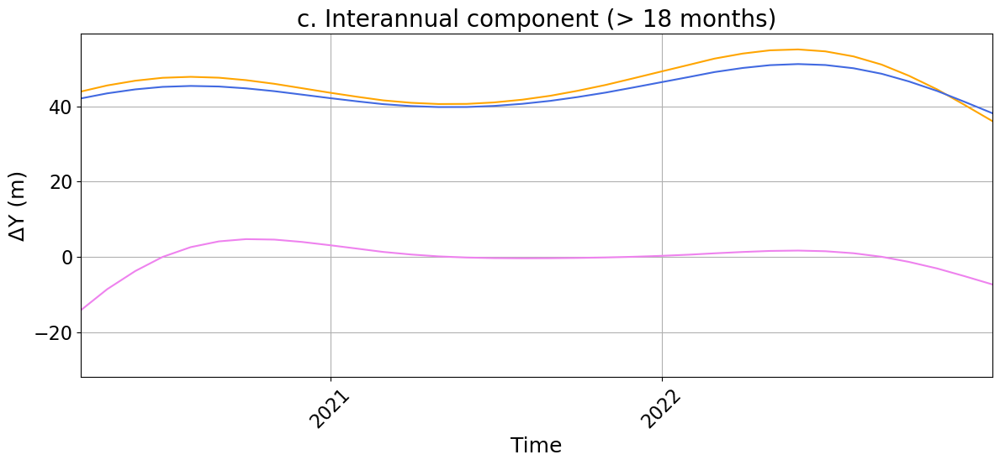

In [169]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, ax = plt.subplots(1, 1, figsize=(12, 6))

# Interannual
ax.plot(
    obs_comp["interannual"].index,
    obs_comp["interannual"],
    color="orange",
    label="Obs",
    linewidth=1.5,
)
ax.plot(
    gc_comp["interannual"].index,
    gc_comp["interannual"],
    color="violet",
    label="GLOBCOAST",
    linewidth=1.5,
)
ax.plot(
    cc_comp["interannual"].index,
    cc_comp["interannual"],
    color="royalblue",
    label="CoSMoS-COAST",
    linewidth=1.5,
)

ax.set_ylabel("ΔY (m)", fontsize=18)
ax.set_title("c. Interannual component (> 18 months)", fontsize=20)
ax.set_xlabel("Time", fontsize=18)
ax.grid(True)

# ----- Yearly x-axis instead of monthly -----
ax.xaxis.set_major_locator(mdates.YearLocator())      # major ticks every year
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))  # show only the year

# Bigger ticks + 45° rotation on x-axis
ax.tick_params(axis="y", labelsize=16)
ax.tick_params(axis="x", labelsize=16, rotation=45)

# Legend
handles, labels = ax.get_legend_handles_labels()
# fig.legend(
#     handles,
#     labels,
#     loc="upper center",
#     ncol=3,
#     bbox_to_anchor=(0.5, 1.02),
#     fontsize=20,
# )
ax.set_xlim(pd.Timestamp("2020-04-01"), df_anom['obs'].index.max())
# ax.set_ylim(-20, 10)

fig.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()

In [149]:
def split_timescales(X, dates, win1=120, win2=540):
    """
    X:    array (time, n_transects)
    dates: DatetimeIndex or array of dates (len = time)
    win1: window for sub-seasonal/seasonal split  (months)
    win2: window for seasonal/interannual split   (months)
    """
    X_df = pd.DataFrame(X, index=pd.to_datetime(dates))

    lp1 = X_df.rolling(win1, center=True, min_periods=1).mean()
    lp2 = X_df.rolling(win2, center=True, min_periods=1).mean()

    sub  = X_df - lp1          # < win1  (sub-seasonal)
    seas = lp1 - lp2           # win1–win2 (seasonal)
    inter = lp2                # > win2  (interannual)

    return sub.values, seas.values, inter.values

hydro_sub, hydro_seas, hydro_inter = split_timescales(dx_CS_Hydro,       model_dates)
lst_sub,   lst_seas,   lst_inter   = split_timescales(dx_CS_MorphoLST,   model_dates)
xsh_sub,   xsh_seas,   xsh_inter   = split_timescales(dx_CS_MorphoXshore, model_dates)

def relative_contribution(A, B, C):
    """
    A, B, C: arrays (time, n_transects) for 3 components
    returns % contribution of each component per transect
    """
    stdA = A.std(axis=0)
    stdB = B.std(axis=0)
    stdC = C.std(axis=0)

    total = stdA + stdB + stdC
    contribA = 100 * stdA / total
    contribB = 100 * stdB / total
    contribC = 100 * stdC / total

    return contribA, contribB, contribC


In [150]:
contrib_Hydro_sub, contrib_LST_sub, contrib_Xshore_sub = relative_contribution(
    hydro_sub, lst_sub, xsh_sub
)
contrib_Hydro_seas, contrib_LST_seas, contrib_Xshore_seas = relative_contribution(
    hydro_seas, lst_seas, xsh_seas
)
contrib_Hydro_inter, contrib_LST_inter, contrib_Xshore_inter = relative_contribution(
    hydro_inter, lst_inter, xsh_inter
)


In [151]:
# ---------- SUB-SEASONNIER ----------
mean_H_sub   = np.nanmean(contrib_Hydro_sub)
mean_LST_sub = np.nanmean(contrib_LST_sub)
mean_X_sub   = np.nanmean(contrib_Xshore_sub)

# ---------- SAISONNIER ----------
mean_H_seas   = np.nanmean(contrib_Hydro_seas)
mean_LST_seas = np.nanmean(contrib_LST_seas)
mean_X_seas   = np.nanmean(contrib_Xshore_seas)

# ---------- INTERANNUEL ----------
mean_H_inter   = np.nanmean(contrib_Hydro_inter)
mean_LST_inter = np.nanmean(contrib_LST_inter)
mean_X_inter   = np.nanmean(contrib_Xshore_inter)


In [152]:
def barplot_with_labels(values, title):
    labels = ["Coastal water level", "Sediment budget", "Dynamic slope"]
    colors = ["tab:blue", "tab:green", "tab:orange"]

    plt.figure(figsize=(6, 6))
    bars = plt.bar(labels, values, color=colors)

    # ✅ Bigger labels
    plt.ylabel("Relative contribution (%)", fontsize=16)

    # ✅ Move title UP using pad
    plt.title(title, fontsize=18, pad=20)

    plt.ylim(0, 100)
    plt.grid(alpha=0.3)

    # ✅ Better x-label readability (rotation + alignment)
    plt.xticks(rotation=10, ha="center", fontsize=16)

    # ✅ Bigger y tick labels
    plt.tick_params(axis='y', labelsize=16)

    # ✅ Value labels on top
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 2,
            f"{height:.1f}%",
            ha="center",
            va="bottom",
            fontsize=22
        )

    plt.tight_layout()
    plt.show()


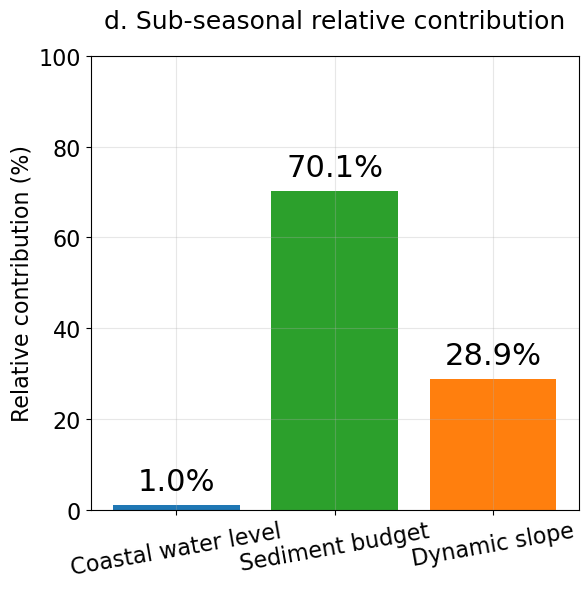

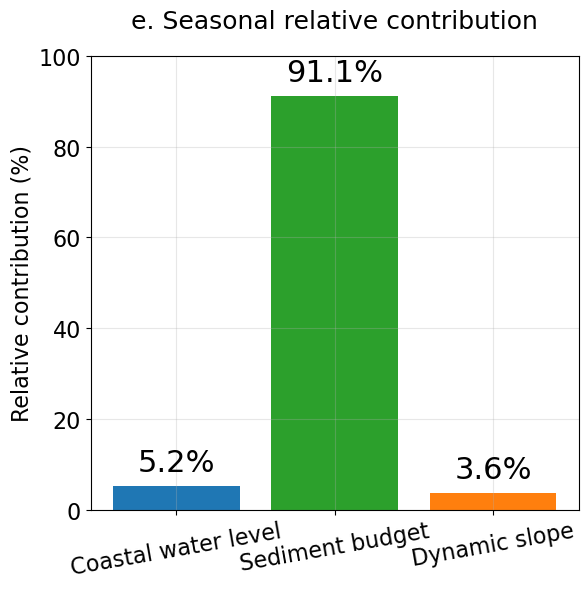

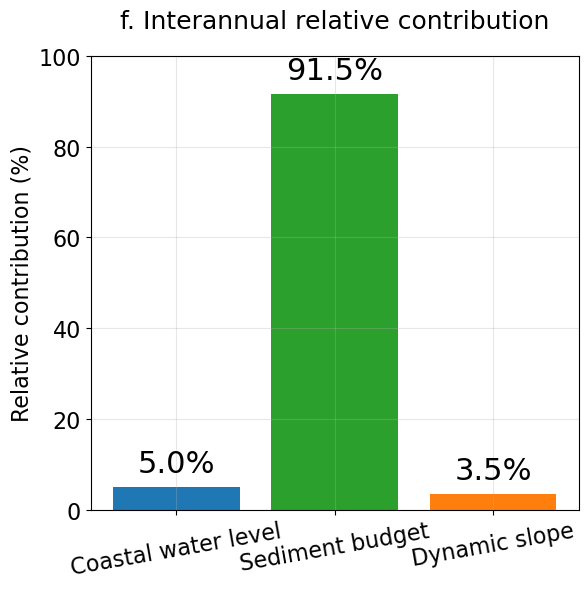

In [153]:
barplot_with_labels([mean_H_sub, mean_LST_sub, mean_X_sub],
                    "d. Sub-seasonal relative contribution")

barplot_with_labels([mean_H_seas, mean_LST_seas, mean_X_seas],
                    "e. Seasonal relative contribution")

barplot_with_labels([mean_H_inter, mean_LST_inter, mean_X_inter],
                    "f. Interannual relative contribution")
